In [38]:
# standard imports
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
#import pygmt
from pyproj import Proj, Geod
from osgeo import gdal
import pygmt
import rioxarray

import sys
sys.path.append('/Users/chanagan/Documents/GitHub/ImageryResources/Functions/')
import TiffTools as tt

# reload modules when changed
%reload_ext autoreload
%autoreload 2

In [39]:
whole_region = [-118.9333,-116.8023,34.6753,35.7367]
w_inset_region = [-118.80343,-118.6959,34.84839,34.92569]
w_inset = [-118.775, -118.76, 34.879, 34.89]
e_inset_region = [-117.0256160 ,-116.899990,35.559928,35.6439349]
e_inset = [-117.02, -117, 35.594, 35.61]

small_region = [-118.764290,-118.697810,34.84965,34.92464]


grid = pygmt.datasets.load_earth_relief(
    resolution='03s',
    region=whole_region,
    use_srtm=True)

dgrid = pygmt.grdgradient(grid=grid, radiance=[315, 60])

P = Proj('epsg:32611')
G = Geod(ellps='WGS84')


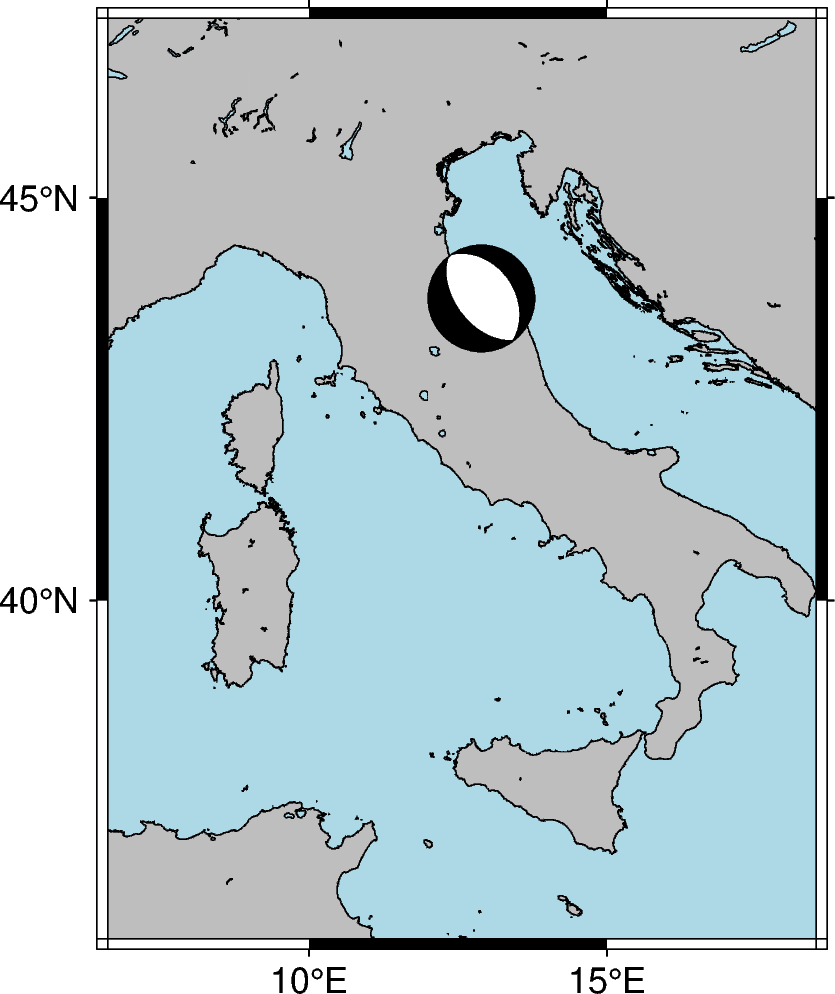

In [2]:
import pygmt 

fig = pygmt.Figure()

# generate a basemap near Washington state showing coastlines, land, and water
fig.coast(
    region='IT',
    projection="M6c",
    land="grey",
    water="lightblue",
    shorelines=True,
    resolution="f",
    frame="a",
)

# store focal mechanisms parameters in a dict
focal_mechanism = dict(strike=142, dip=52, rake=-92, magnitude=4.5)

# pass the focal mechanism data to meca in addition to the scale and event location
fig.meca(focal_mechanism, scale="1c", longitude=12.889, latitude=43.7855, depth=3)

fig.show()


# Overview

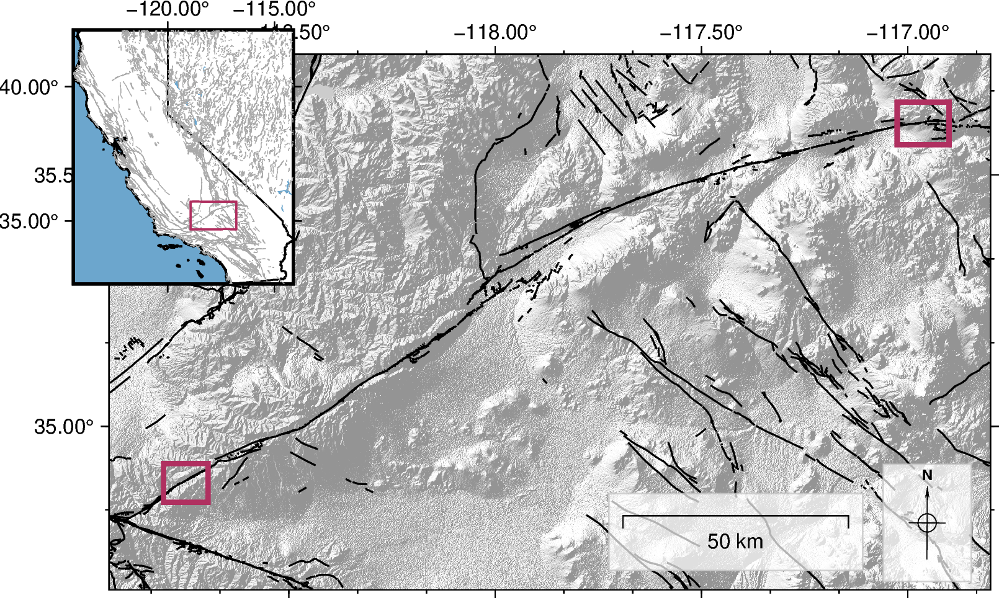

In [85]:
# Introductory figure base
fig = pygmt.Figure()

# Configuration for the 'current figure'.
pygmt.config(MAP_FRAME_TYPE="plain")
pygmt.config(FORMAT_GEO_MAP="ddd.xx")
pygmt.config(FONT_ANNOT_PRIMARY="8p")
pygmt.config(FONT_ANNOT_SECONDARY="6p")

# Plot the base map of the main figure. 
fig.basemap(region=whole_region, projection="M12c", frame=["WNse", "af"])

# Hillshade
pygmt.makecpt(cmap="gray", series=[-2.7, 0.3, 0.01],transparency=60)
fig.grdimage(grid=dgrid, cmap=True)


# Plot a rectangle ("r") in the inset map to show the area of the main
# figure. "+s" means that the first two columns are the longitude and
# latitude of the bottom left corner of the rectangle, and the last two
# columns the longitude and latitude of the upper right corner.
fig.plot(data='/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Data/Qfaults_GIS/SHP/Qfaults_US_Database.shp', pen="0.6p,black")
rectangle = [[e_inset_region[0], e_inset_region[2], e_inset_region[1], e_inset_region[3]]]
fig.plot(data=rectangle, style="r+s", pen="2p,maroon")
rectangle = [[w_inset_region[0], w_inset_region[2], w_inset_region[1], w_inset_region[3]]]
fig.plot(data=rectangle, style="r+s", pen="2p,maroon")

fig.basemap(map_scale='JBR+w50k+o-5c/-1c+lkm',box="+c0.1/0.3+gwhite@30+p0.5p,grey@30,solid",rose='jBR+l,,,N+o0.6/0.4+w1c')

# Create an inset map, placing it in the Bottom Right (BR) corner with x- and
# y-offsets of 0.1 cm, respectively.
# The inset map contains the Japan main land. "U54S/3c" means UTM projection
# with a map width of 3 cm. The inset width and height are automatically
# calculated from the specified ``region`` and ``projection`` parameters.
# Draws a rectangular box around the inset with a fill color of "white" and
# a pen of "1p".
with fig.inset(
    position="jTL+o-1.5c/-1.5c",
    margin='1c',
    region='US.CA',
    projection="M5c",
):
    fig.coast(
        region='US.CA',
        dcw="US.CA+p0.6p,black+gwhite",
        land='white',
        borders='1',
        water='skyblue3',
        frame=["WNse", "a"],
    )
    rectangle = [[whole_region[0], whole_region[2], whole_region[1], whole_region[3]]]
    fig.plot(data='/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Data/Qfaults_GIS/SHP/Qfaults_US_Database.shp', pen="0.2p,darkgrey")
    fig.plot(data=rectangle,style="r+s", pen="0.7p,black")
#fig.savefig('/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Manuscripts/Garlock/Figures/GarlockIntroMap.pdf',dpi=300)

fig.show()


In [13]:
# Load dem for small west region
image = rioxarray.open_rasterio('/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/2019GarlockWestDEM-cropped.tif')
im1_lonlat = image.rio.reproject("EPSG:4326")
dgrid = pygmt.grdgradient(grid=im1_lonlat, radiance=[270, 30])

/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdgradient.py:170: RuntimeWarning: Input image has dtype: float32 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


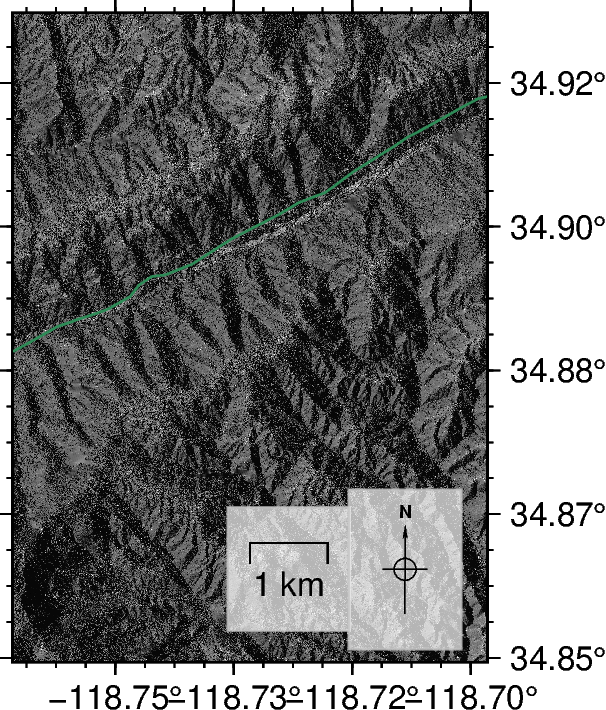

In [16]:

# Subfigures with the predeformed orthomosaics
# Introductory figure base
fig = pygmt.Figure()

# Configuration for the 'current figure'.
pygmt.config(MAP_FRAME_TYPE="plain")
pygmt.config(FORMAT_GEO_MAP="ddd.xx")
pygmt.config(FONT_ANNOT_PRIMARY="8p")
pygmt.config(FONT_ANNOT_SECONDARY="6p")

# Plot the base map of the main figure. 
fig.basemap(region=small_region, projection="M4c", frame=["ESnw", "af"])

# DEM
pygmt.makecpt(cmap="gray", series=[-1, 0.75, 0.01],transparency=60)
fig.grdimage(grid=dgrid,cmap=True)
# Fault
pts = pd.read_csv('/Volumes/Extreme Pro/Projects/Garlock/GIS/WestPoints.csv')
pts['id'] = pts.index
# Project to UTM
pts['x'], pts['y'] = pts.Lon, pts.Lat
pts.dropna(inplace=True)
pts['Lon'] = P(pts['x'],pts['y'],inverse=True)[0]
pts['Lat'] = P(pts['x'],pts['y'],inverse=True)[1]
pts.sort_values(by='Lon',ascending=True,inplace=True)
fig.plot(x=pts.Lon,y=pts.Lat,pen="0.5p,seagreen")

fig.basemap(map_scale='JBR+w1k+o-2c/-1c+lkm',box="+c0.1/0.3+gwhite@30+p0.5p,grey@30,solid",rose='jBR+l,,,N+o0.5/0.4+w0.75c')
fig.savefig('/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Manuscripts/Garlock/Figures/GarlockWDEMSmallRegion.pdf',dpi=300)
fig.show()

# East and West Orthophotos

In [5]:
# Load ortho
image = rioxarray.open_rasterio('/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Projects/Garlock/Deformation/East/micmac/20APR28214017-P1BS_R3C1-merged-f32.tif')
im1_lonlat = image.rio.reproject("EPSG:4326")
# Load ortho
image = rioxarray.open_rasterio('/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Projects/Garlock/Deformation/West/micmac/19JUL26214314-P1BS-merged-f32.tif')
im2_lonlat = image.rio.reproject("EPSG:4326")


/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float32 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


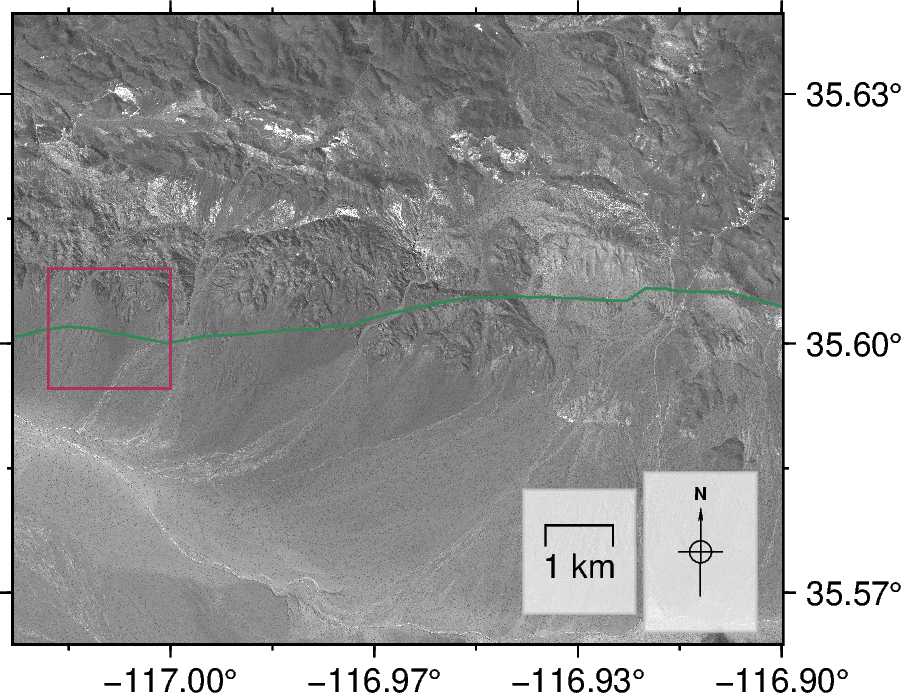

In [22]:
# Subfigures with the predeformed orthomosaics
# Introductory figure base
fig = pygmt.Figure()

# Configuration for the 'current figure'.
pygmt.config(MAP_FRAME_TYPE="plain")
pygmt.config(FORMAT_GEO_MAP="ddd.xx")
pygmt.config(FONT_ANNOT_PRIMARY="8p")
pygmt.config(FONT_ANNOT_SECONDARY="6p")

# Plot the base map of the main figure. 
fig.basemap(region=e_inset_region, projection="M6.5c", frame=["ESnw", "af"])

# Orthophoto
pygmt.makecpt(cmap="gray", series=[0,750, 1])
fig.grdimage(grid=im1_lonlat,cmap=True)
# Fault Trace
pts = pd.read_csv('/Volumes/Extreme Pro/Projects/Garlock/GIS/EastPoints.csv')
pts.sort_values(by='Lon',ascending=True,inplace=True)
fig.plot(x=pts.Lon,y=pts.Lat,pen="0.5p,darkgreen")

rectangle = [[e_inset[0], e_inset[2], e_inset[1], e_inset[3]]]
fig.plot(data=rectangle, style="r+s", pen="0.55p,maroon")


fig.basemap(map_scale='JBR+w1k+o-2c/-1c+lkm',box="+c0.1/0.3+gwhite@30+p0.5p,grey@30,solid",rose='jBR+l,,,N+o0.5/0.4+w0.75c')
#fig.savefig('/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Manuscripts/Garlock/Figures/GarlockEInset.pdf',dpi=300)
fig.show()


/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float32 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


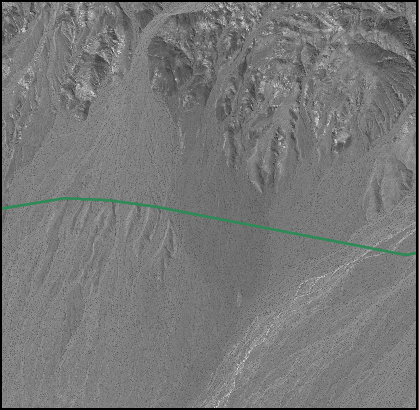

In [64]:
# Subfigures with the predeformed orthomosaics
# Introductory figure base
fig = pygmt.Figure()

# Configuration for the 'current figure'.
pygmt.config(MAP_FRAME_TYPE="plain")
pygmt.config(FORMAT_GEO_MAP="ddd.xx")
pygmt.config(FONT_ANNOT_PRIMARY="8p")
pygmt.config(FONT_ANNOT_SECONDARY="6p")

# Plot the base map of the main figure. 
fig.basemap(region=e_inset, projection="M3.5c", frame=["esnw"])

# Orthophoto
pygmt.makecpt(cmap="gray", series=[0,750, 1])
fig.grdimage(grid=im1_lonlat,cmap=True)
pts = pd.read_csv('/Volumes/Extreme Pro/Projects/Garlock/GIS/EastPoints.csv')
pts.sort_values(by='Lon',ascending=True,inplace=True)
fig.plot(x=pts.Lon,y=pts.Lat,pen="0.5p,darkgreen")

#fig.savefig('/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Manuscripts/Garlock/Figures/GarlockEInsetZoom.pdf',dpi=300)
fig.show()

/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float32 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


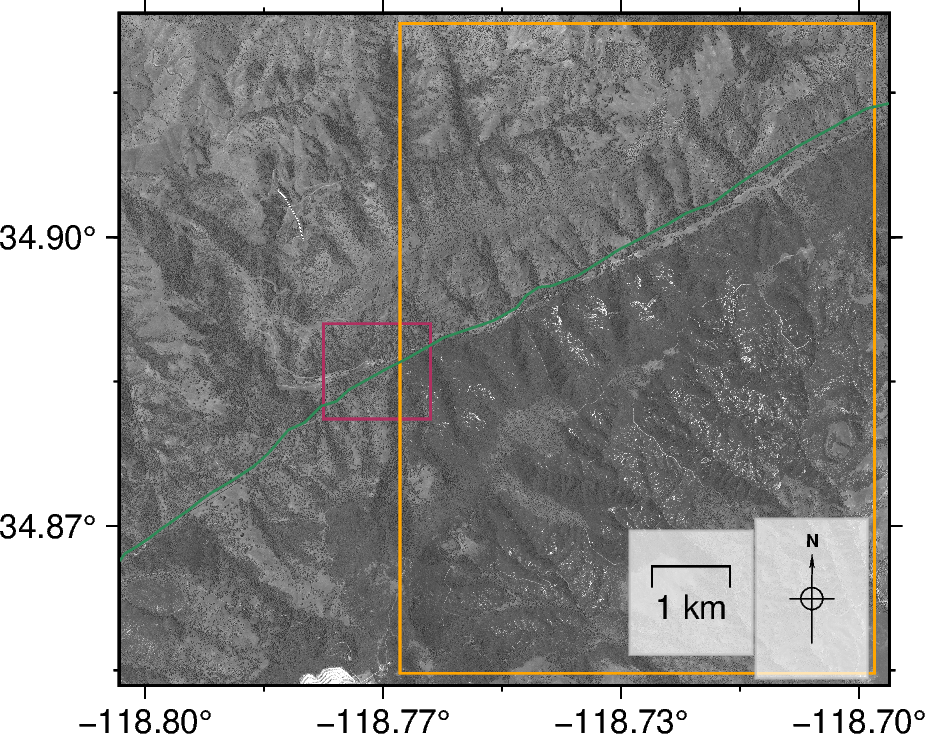

In [13]:
# Subfigures with the predeformed orthomosaics
# Introductory figure base
fig = pygmt.Figure()

# Configuration for the 'current figure'.
pygmt.config(MAP_FRAME_TYPE="plain")
pygmt.config(FORMAT_GEO_MAP="ddd.xx")
pygmt.config(FONT_ANNOT_PRIMARY="8p")
pygmt.config(FONT_ANNOT_SECONDARY="6p")

# Plot the base map of the main figure. 
fig.basemap(region=w_inset_region, projection="M6.5c", frame=["WSen", "af"])

# Orthophoto
pygmt.makecpt(cmap="gray", series=[0,750, 1])
fig.grdimage(grid=im2_lonlat,cmap=True)

# Inset of inset
rectangle = [[w_inset[0], w_inset[2], w_inset[1], w_inset[3]]]
fig.plot(data=rectangle, style="r+s", pen="0.55p,maroon")
# Inset of inset
rectangle = [[small_region[0], small_region[2], small_region[1], small_region[3]]]
fig.plot(data=rectangle, style="r+s", pen="0.55p,orange")

# Fault
pts = pd.read_csv('/Volumes/Extreme Pro/Projects/Garlock/GIS/WestPoints.csv')
pts['id'] = pts.index
# Project to UTM
pts['x'], pts['y'] = pts.Lon, pts.Lat
pts.dropna(inplace=True)
pts['Lon'] = P(pts['x'],pts['y'],inverse=True)[0]
pts['Lat'] = P(pts['x'],pts['y'],inverse=True)[1]
pts.sort_values(by='Lon',ascending=True,inplace=True)
fig.plot(x=pts.Lon,y=pts.Lat,pen="0.5p,seagreen")

fig.basemap(map_scale='JBR+w1k+o-2c/-1c+lkm',box="+c0.1/0.3+gwhite@30+p0.5p,grey@30,solid",rose='jBR+l,,,N+o0.46/0.35+w0.75c')
#fig.savefig('/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Manuscripts/Garlock/Figures/GarlockWInset.pdf',dpi=300)

fig.show()

/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float32 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


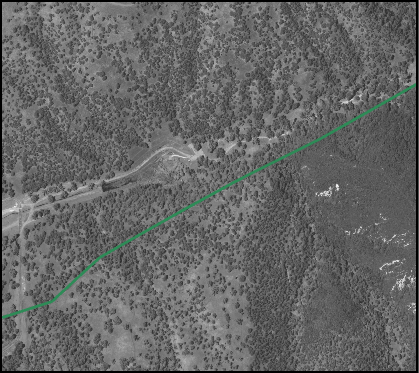

In [68]:
# Subfigures with the predeformed orthomosaics
# Introductory figure base
fig = pygmt.Figure()

# Configuration for the 'current figure'.
pygmt.config(MAP_FRAME_TYPE="plain")
pygmt.config(FORMAT_GEO_MAP="ddd.xx")
pygmt.config(FONT_ANNOT_PRIMARY="8p")
pygmt.config(FONT_ANNOT_SECONDARY="6p")

# Plot the base map of the main figure. 
fig.basemap(region=w_inset, projection="M3.5c", frame=["wsen"])

# Orthophoto
pygmt.makecpt(cmap="gray", series=[0,750, 1])
fig.grdimage(grid=im2_lonlat,cmap=True)

# Fault
pts = pd.read_csv('/Volumes/Extreme Pro/Projects/Garlock/GIS/WestPoints.csv')
pts['id'] = pts.index
# Project to UTM
pts['x'], pts['y'] = pts.Lon, pts.Lat
pts.dropna(inplace=True)
pts['Lon'] = P(pts['x'],pts['y'],inverse=True)[0]
pts['Lat'] = P(pts['x'],pts['y'],inverse=True)[1]
pts.sort_values(by='Lon',ascending=True,inplace=True)
fig.plot(x=pts.Lon,y=pts.Lat,pen="0.5p,darkgreen")

#fig.savefig('/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Manuscripts/Garlock/Figures/GarlockWInsetZoom.pdf',dpi=300)

fig.show()

## DEMs and Land Cover Classification maps

In [3]:
# Load dems and landcover
image = rioxarray.open_rasterio('/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/2019GarlockWestDEM-cropped.tif')
im1_lonlat = image.rio.reproject("EPSG:4326")
image = rioxarray.open_rasterio('/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/2020GarlockEastDEM-cropped-f32.tif')
im2_lonlat = image.rio.reproject("EPSG:4326")
image = rioxarray.open_rasterio('/Volumes/Extreme Pro/Projects/Garlock/ESA_WORLDCOVER_10M_2021_V200/ESA_WorldCover_clippedGarlockWestAOI_10m.tif')
im3_lonlat = image.rio.reproject("EPSG:4326")
image = rioxarray.open_rasterio('/Volumes/Extreme Pro/Projects/Garlock/ESA_WORLDCOVER_10M_2021_V200/ESA_WorldCover_clippedGarlockEastAOI_10m.tif')
im4_lonlat = image.rio.reproject("EPSG:4326")

<>:21: SyntaxWarning: "is" with 'str' literal. Did you mean "=="?
<>:21: SyntaxWarning: "is" with 'str' literal. Did you mean "=="?
/var/folders/zn/w54gt7k11csfs1n4z8r3xccsyqhmjz/T/ipykernel_61008/1170631562.py:21: SyntaxWarning: "is" with 'str' literal. Did you mean "=="?
  if name is 'W':
/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float32 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


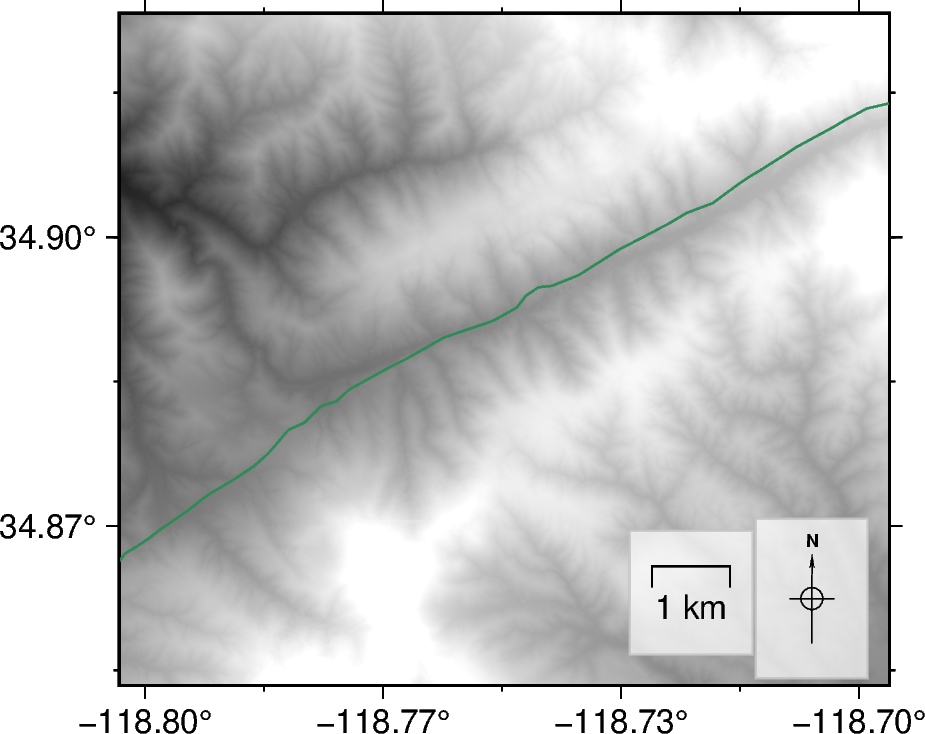

: 

: 

In [ ]:
# Define the region and grid for each subplot
region = [w_inset_region,e_inset_region]  # Define your main region
images = [im1_lonlat,im2_lonlat]
name = ['W','E']

for reg, im, name in zip(region,images,name):
    fig = pygmt.Figure()

    # Configuration for the 'current figure'.
    pygmt.config(MAP_FRAME_TYPE="plain",FORMAT_GEO_MAP="ddd.xx",
                 FONT_ANNOT_PRIMARY="8p",FONT_ANNOT_SECONDARY="6p")

    # Plot the base map of the main figure. 
    fig.basemap(region=reg, projection="M6.5c", frame=["WSen", "af"])

    # Orthophoto
    pygmt.makecpt(cmap="gray", series=[500, 1500])
    fig.grdimage(grid=im,cmap=True)

    # Faults
    if name is 'W':
        pts = pd.read_csv('/Volumes/Extreme Pro/Projects/Garlock/GIS/WestPoints.csv')
        pts['id'] = pts.index
        # Project to UTM
        pts['x'], pts['y'] = pts.Lon, pts.Lat
        pts.dropna(inplace=True)
        pts['Lon'] = P(pts['x'],pts['y'],inverse=True)[0]
        pts['Lat'] = P(pts['x'],pts['y'],inverse=True)[1]
        pts.sort_values(by='Lon',ascending=True,inplace=True)
    else: 
        pts = pd.read_csv('/Volumes/Extreme Pro/Projects/Garlock/GIS/EastPoints.csv')
        pts.sort_values(by='Lon',ascending=True,inplace=True)
        
    fig.plot(x=pts.Lon,y=pts.Lat,pen="0.5p,seagreen")

    fig.basemap(map_scale='JBR+w1k+o-2c/-1c+lkm',box="+c0.1/0.3+gwhite@30+p0.5p,grey@30,solid",rose='jBR+l,,,N+o0.46/0.35+w0.75c')
    #fig.savefig(f'/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Manuscripts/Garlock/Figures/Garlock{name}DEM.pdf',dpi=300)

    fig.show()


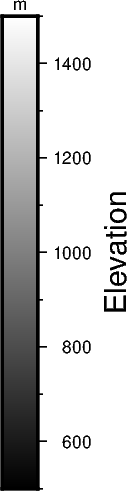

In [ ]:
fig = pygmt.Figure()
# Configuration for the 'current figure'.
pygmt.config(MAP_FRAME_TYPE="plain",FORMAT_GEO_MAP="ddd.xx",FONT_ANNOT_PRIMARY="8p",FONT_ANNOT_SECONDARY="8p")
pygmt.makecpt(cmap="gray", series=[500, 1500])
fig.colorbar(region=[0,0.5,0,0.5],projection="M4c",position='jC+w4c/0.3c+v',frame=["x+lElevation", "y+lm"])
#fig.savefig(f'/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Manuscripts/Garlock/Figures/ColorbarDEM.pdf',dpi=300)
fig.show()


/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: uint16 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,
grdimage [WARNING]: Your CPT is categorical. Enabling -nn+a to avoid interpolation across categories.


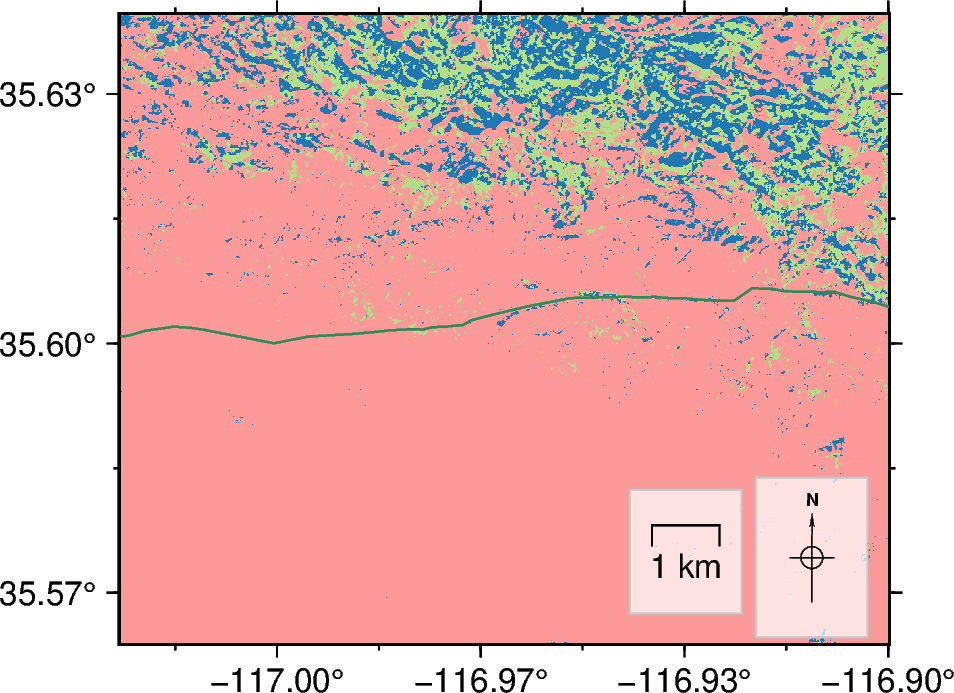

In [40]:
import pygmt
import pandas as pd

# Define the region and grid for each subplot
region = [w_inset_region,e_inset_region]  # Define your main region
images = [im3_lonlat,im4_lonlat]
name = ['W','E']

# World Cover Colors
# Define colorblind-friendly colors
colors = [
    '#377eb8',  # Blue
    '#e41a1c',  # Red
    '#4daf4a',  # Green
    '#ff7f00',  # Orange
    '#984ea3',  # Purple
    '#a65628',  # Brown
]

# Map of ESA WorldCover 2021 classes
landcover_names = {
    10: 'Trees',
    20: 'Shrubs',
    30: 'Grassland',
    50: 'Built-up',
    60: 'Barren', 
    80: 'Water'
}

for reg, im, name in zip(region[-1:],images[-1:],name[-1:]):
    fig = pygmt.Figure()

    # Configuration for the 'current figure'.
    pygmt.config(MAP_FRAME_TYPE="plain",FORMAT_GEO_MAP="ddd.xx",
                 FONT_ANNOT_PRIMARY="8p",FONT_ANNOT_SECONDARY="6p")

    # Plot the base map of the main figure. 
    fig.basemap(region=reg, projection="M6.5c", frame=["WSen", "af"])

    # Orthophoto
    C = colors[0]+'/'+colors[0]+'/'+colors[0]+'/'+colors[0]+'/'+colors[0]+'/'+colors[0]
    labels=str(list(landcover_names.values())).replace('\', \'',',').replace('[\'','').replace('\']','')
    pygmt.makecpt(series=(0,i,1),cmap='paired',color_model=f'+c{labels}')
    im.data = im.data.astype('uint16')
    for i,n in enumerate(landcover_names.keys()):
        im.data[im.data == n] = i
    fig.grdimage(grid=im)

    # Faults
    if name == 'W':
        pts = pd.read_csv('/Volumes/Extreme Pro/Projects/Garlock/GIS/WestPoints.csv')
        pts['id'] = pts.index
        # Project to UTM
        pts['x'], pts['y'] = pts.Lon, pts.Lat
        pts.dropna(inplace=True)
        pts['Lon'] = P(pts['x'],pts['y'],inverse=True)[0]
        pts['Lat'] = P(pts['x'],pts['y'],inverse=True)[1]
        pts.sort_values(by='Lon',ascending=True,inplace=True)
    else: 
        pts = pd.read_csv('/Volumes/Extreme Pro/Projects/Garlock/GIS/EastPoints.csv')
        pts.sort_values(by='Lon',ascending=True,inplace=True)
        
    fig.plot(x=pts.Lon,y=pts.Lat,pen="0.5p,seagreen")

    fig.basemap(map_scale='JBR+w1k+o-2c/-1c+lkm',box="+c0.1/0.3+gwhite@30+p0.5p,grey@30,solid",rose='jBR+l,,,N+o0.46/0.35+w0.75c')
    fig.savefig(f'/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Manuscripts/Garlock/Figures/Garlock{name}LandCover.png',dpi=300)

    fig.show()

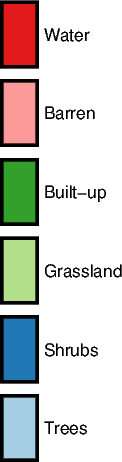

In [32]:
fig = pygmt.Figure()
# Configuration for the 'current figure'.
pygmt.config(MAP_FRAME_TYPE="plain",FORMAT_GEO_MAP="ddd.xx",FONT_ANNOT_PRIMARY="8p",FONT_ANNOT_SECONDARY="8p")
# Orthophoto
C = colors[0]+'/'+colors[0]+'/'+colors[0]+'/'+colors[0]+'/'+colors[0]+'/'+colors[0]
labels=str(list(landcover_names.values())).replace('\', \'',',').replace('[\'','').replace('\']','')
pygmt.makecpt(series=(0,i,1),cmap='paired',color_model=f'+c{labels}')
fig.colorbar(region=[0,0.5,0,0.5],projection="M4c",position='jC+w4c/0.3c+v')
fig.savefig(f'/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Manuscripts/Garlock/Figures/ColorbarClassification.pdf',dpi=300)
fig.show()

# Deformation grids

In [ ]:
# Load deformation grids
im1_lonlat = rioxarray.open_rasterio('/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/EastdX-rioEPSG4326.tif')
im2_lonlat = rioxarray.open_rasterio('/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/EastdY-rioEPSG4326.tif')
im3_lonlat = rioxarray.open_rasterio('/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/EastdZ-rio-x4EPSG4326.tif')

im4_lonlat = rioxarray.open_rasterio('/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/WestdX-rioEPSG4326.tif')
im5_lonlat = rioxarray.open_rasterio('/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/WestdY-rioEPSG4326.tif')
im6_lonlat = rioxarray.open_rasterio('/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/WestdZ-rio-x4EPSG4326.tif')

RasterioIOError: /Volumes/Extreme Pro/Projects/Garlock/Deformation/East/EastdX-rioEPSG4326.tif: No such file or directory

/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float64 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


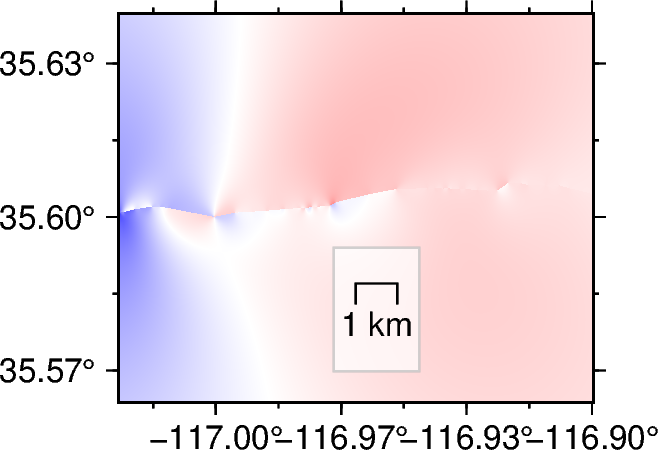

In [5]:
# Subfigures with the predeformed orthomosaics
# Introductory figure base
name = ['Edx','Edy','Edz','Wdx','Wdy','Wdz']
imlist = [im1_lonlat,im2_lonlat,im3_lonlat,im4_lonlat,im5_lonlat,im6_lonlat]
for im,n in zip([imlist[1]],[name[1]]):
    fig = pygmt.Figure()

    # Configuration for the 'current figure'.
    pygmt.config(MAP_FRAME_TYPE="plain")
    pygmt.config(FORMAT_GEO_MAP="ddd.xx")
    pygmt.config(FONT_ANNOT_PRIMARY="8p")
    pygmt.config(FONT_ANNOT_SECONDARY="6p")

    # Plot the base map of the main figure. 
    if n.startswith('E'):
        fig.basemap(region=e_inset_region, projection="M4c", frame=["WSen", "af"])
    else:
        fig.basemap(region=w_inset_region, projection="M4c", frame=["WSen", "af"])

    pygmt.makecpt(cmap='polar',series=[-1,1],background='o',reverse=True)
    fig.grdimage(grid=im,cmap=True)

    fig.basemap(map_scale='JBR+w1k+o-2c/-1c+lkm',box="+c0.1/0.3+gwhite@30+p0.5p,grey@30,solid")#,rose='jBR+l,,,N+o0.5/0.3+w0.75c')
    fig.savefig(f'/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Manuscripts/Garlock/Figures/{n}Map.pdf',dpi=300)
    fig.show()

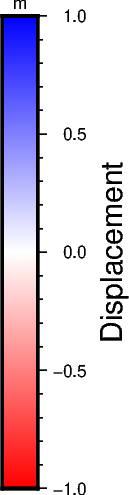

In [36]:
fig = pygmt.Figure()
# Configuration for the 'current figure'.
pygmt.config(MAP_FRAME_TYPE="plain")
pygmt.config(FORMAT_GEO_MAP="ddd.xx")
pygmt.config(FONT_ANNOT_PRIMARY="8p")
pygmt.config(FONT_ANNOT_SECONDARY="8p")
pygmt.makecpt(cmap='polar',series=[-1,1],background='o',reverse=True)
fig.colorbar(region=[0,0.5,0,0.5],projection="M4c",position='jC+w4c/0.3c+v',frame=["x+lDisplacement", "y+lm"])
fig.savefig(f'/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Manuscripts/Garlock/Figures/Colorbar0.5.pdf',dpi=300)
fig.show()

## Filtered result maps and residual maps

/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float64 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


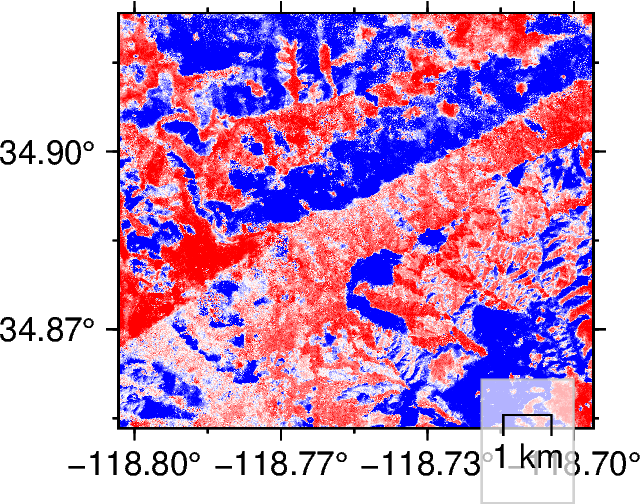

/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float64 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


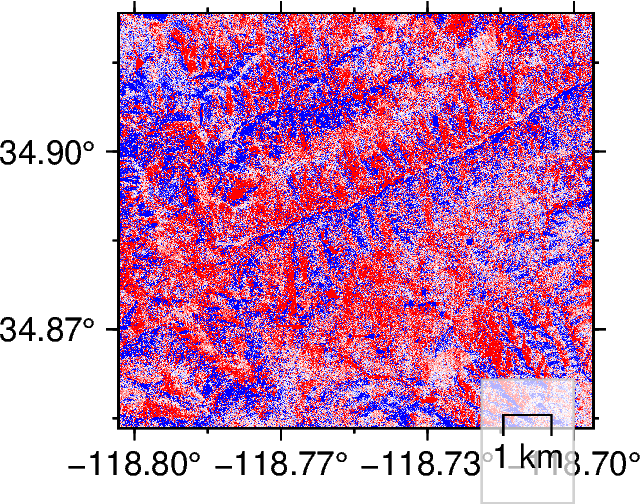

In [3]:
# Load deformation grids
im1_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/EWDispStackedEPSG4326.tif'
im2_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/NSDispStackedEPSG4326.tif'
im3_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/UDDispStackedEPSG4326.tif'

im4_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/EWDispStackedEPSG4326.tif'
im5_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/NSDispStackedEPSG4326.tif'
im6_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/UDDispStackedEPSG4326.tif'
# Subfigures with the predeformed orthomosaics
# Introductory figure base
name = ['ExNoFilt','EyNoFilt','EzNoFilt','WxNoFilt','WyNoFilt','WzNoFilt']
imlist = [im1_lonlat,im2_lonlat,im3_lonlat,im4_lonlat,im5_lonlat,im6_lonlat]
for iml,n in zip(imlist[4:],name[4:]):
    im = rioxarray.open_rasterio(iml)
    fig = pygmt.Figure()

    # Configuration for the 'current figure'.
    pygmt.config(MAP_FRAME_TYPE="plain")
    pygmt.config(FORMAT_GEO_MAP="ddd.xx")
    pygmt.config(FONT_ANNOT_PRIMARY="8p")
    pygmt.config(FONT_ANNOT_SECONDARY="6p")

    # Plot the base map of the main figure. 
    if n.startswith('E'):
        fig.basemap(region=e_inset_region, projection="M4c", frame=["WSen", "af"])
    else:
        fig.basemap(region=w_inset_region, projection="M4c", frame=["WSen", "af"])

    pygmt.makecpt(cmap='polar',series=[-1,1],background='o',reverse=True)
    fig.grdimage(grid=im,cmap=True)

    fig.basemap(map_scale='JBR+w1k+o-0.75c/-0.1c+lkm',box="+c0.1/0.3+gwhite@30+p0.5p,grey@30,solid")#,rose='jBR+l,,,N+o0.5/0.3+w0.75c')
    fig.savefig(f'/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Manuscripts/Garlock/Figures/{n}Map.pdf',dpi=300)
    fig.show()

/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float64 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


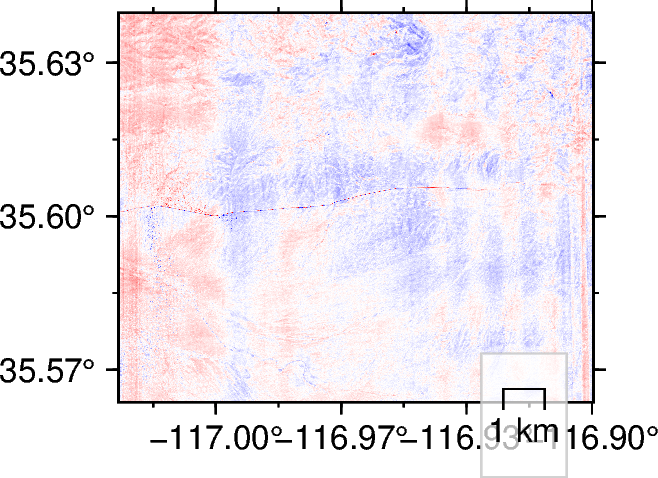

/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float64 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


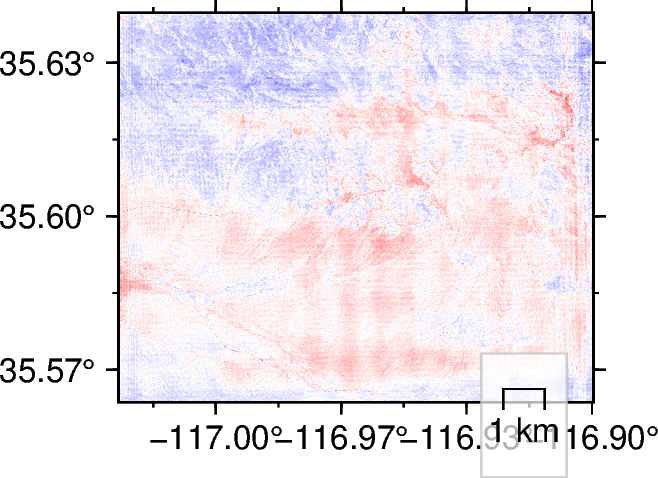

/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float64 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


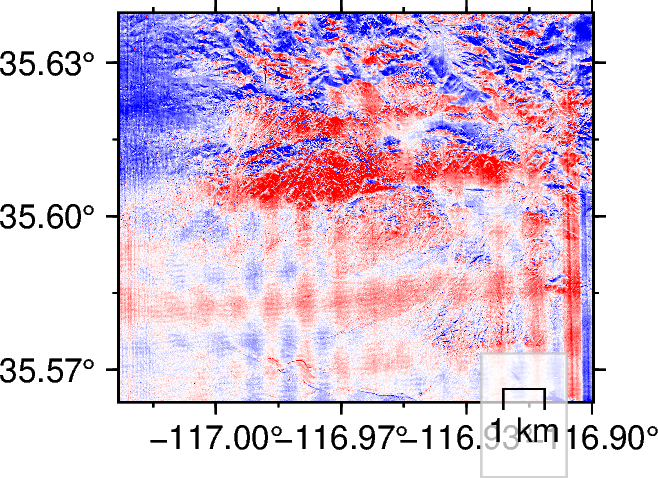

/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float64 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


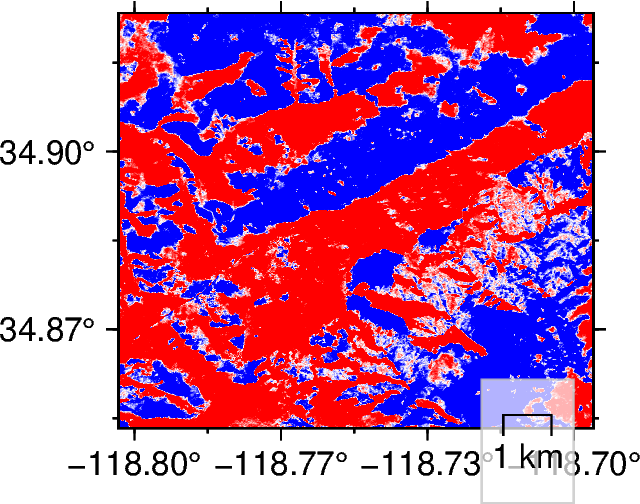

/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float64 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


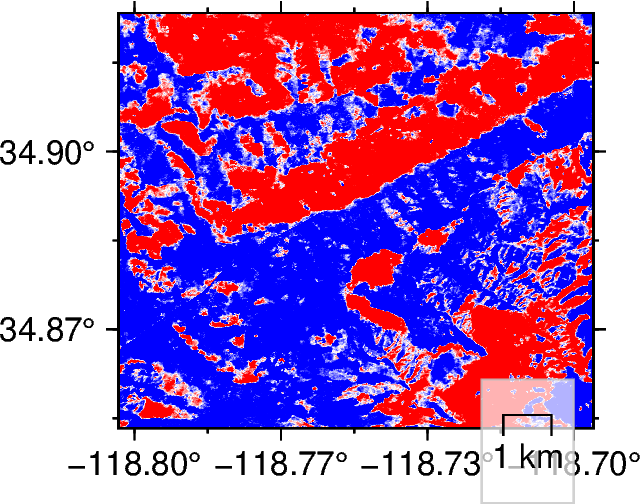

/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float64 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


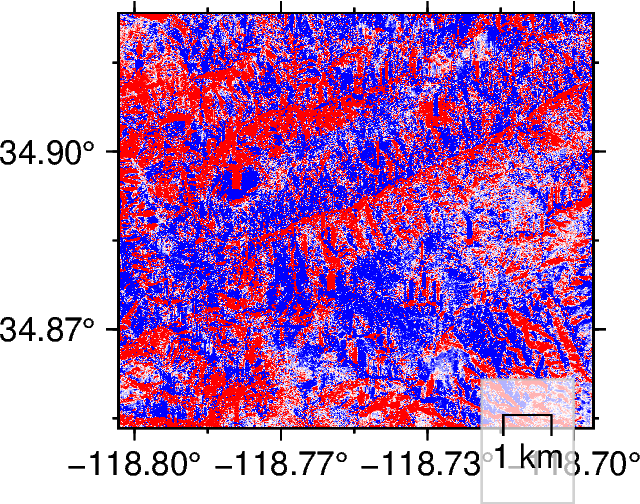

In [ ]:
# Load deformation grids
im1_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/EWDispStackedEPSG4326_bidenoise_filtered.tif'
im2_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/NSDispStackedEPSG4326_bidenoise_filtered.tif'
im3_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/UDDispStackedEPSG4326_bidenoise_filtered_refiltered.tif'

im4_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/EWDispStackedEPSG4326_bidenoise_filtered.tif'
im5_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/NSDispStackedEPSG4326_bidenoise_filtered.tif'
im6_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/UDDispStackedEPSG4326_bidenoise_filtered_refiltered.tif'

im1m_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/EastdX-rioEPSG4326.tif'
im2m_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/EastdY-rioEPSG4326.tif'
im3m_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/EastdZ-rio-x4EPSG4326.tif'

im4m_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/WestdX-rioEPSG4326.tif'
im5m_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/WestdY-rioEPSG4326.tif'
im6m_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/WestdZ-rio-x4EPSG4326.tif'

# Introductory figure base
name = ['ExDenoiseFiltRes','EyDenoiseFiltRes','EzDenoiseFiltRes','WxDenoiseFiltRes','WyDenoiseFiltRes','WzDenoiseFiltRes']
imlist = [im1_lonlat,im2_lonlat,im3_lonlat,im4_lonlat,im5_lonlat,im6_lonlat]
immlist = [im1m_lonlat,im2m_lonlat,im3m_lonlat,im4m_lonlat,im5m_lonlat,im6m_lonlat]
for iml,imm,n in zip(imlist,immlist,name):
    immo = rioxarray.open_rasterio(imm)
    imob = rioxarray.open_rasterio(iml)
    im = immo - imob # model minus observed
    im -= im.mean()

    fig = pygmt.Figure()

    # Configuration for the 'current figure'.
    pygmt.config(MAP_FRAME_TYPE="plain")
    pygmt.config(FORMAT_GEO_MAP="ddd.xx")
    pygmt.config(FONT_ANNOT_PRIMARY="8p")
    pygmt.config(FONT_ANNOT_SECONDARY="6p")

    # Plot the base map of the main figure. 
    if n.startswith('E'):
        fig.basemap(region=e_inset_region, projection="M4c", frame=["WSen", "af"])
    else:
        fig.basemap(region=w_inset_region, projection="M4c", frame=["WSen", "af"])

    pygmt.makecpt(cmap='polar',series=[-0.5,0.5],background='o',reverse=True)
    fig.grdimage(grid=im,cmap=True)

    fig.basemap(map_scale='JBR+w1k+o-0.75c/-0.1c+lkm',box="+c0.1/0.3+gwhite@30+p0.5p,grey@30,solid")#,rose='jBR+l,,,N+o0.5/0.3+w0.75c')
    fig.savefig(f'/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Manuscripts/Garlock/Figures/{n}Map.pdf',dpi=300)
    fig.show()

/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float64 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


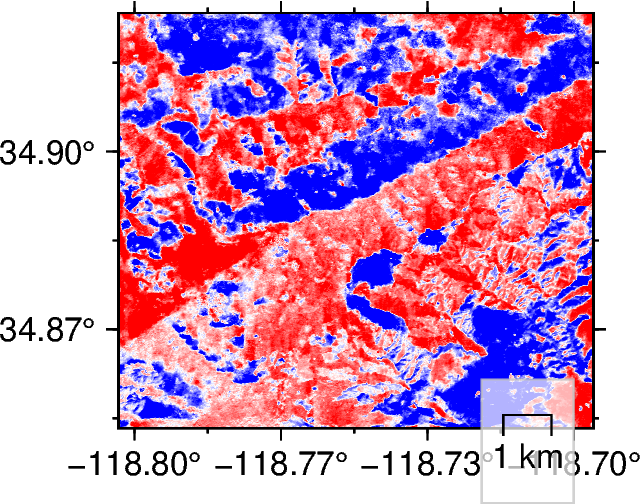

/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float64 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


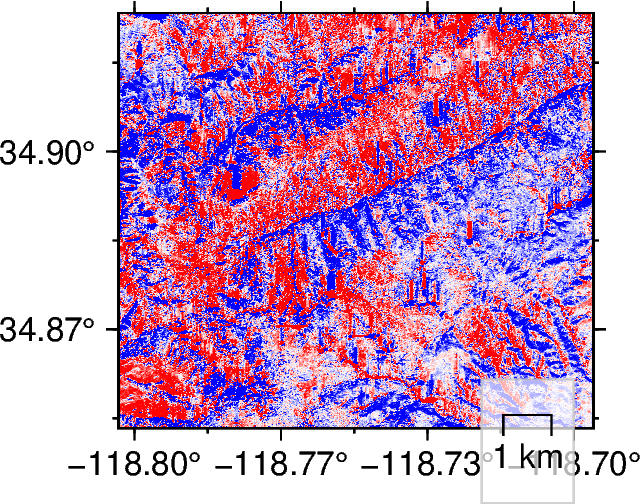

In [5]:
# Load deformation grids
im1_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/EWDispStackedEPSG4326_bidenoise_filtered.tif'
im2_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/NSDispStackedEPSG4326_bidenoise_filtered.tif'
im3_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/UDfromHDispStackedEPSG4326_bidenoise_filtered_refiltered.tif'

im4_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/EWDispStackedEPSG4326_bidenoise_filtered.tif'
im5_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/NSDispStackedEPSG4326_bidenoise_filtered.tif'
im6_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/UDfromHDispStackedEPSG4326_bidenoise_filtered_refiltered.tif'

# Introductory figure base
name = ['ExDenoiseFiltOrthoStacked','EyDenoiseFiltOrthoStacked','EzDenoiseFiltOrthoStacked','WxDenoiseFiltOrthoStacked','WyDenoiseFiltOrthoStacked','WzDenoiseFiltOrthoStacked']
imlist = [im1_lonlat,im2_lonlat,im3_lonlat,im4_lonlat,im5_lonlat,im6_lonlat]
for iml,n in zip(imlist[4:],name[4:]):
    im = rioxarray.open_rasterio(iml)
    im -= im.mean()

    fig = pygmt.Figure()

    # Configuration for the 'current figure'.
    pygmt.config(MAP_FRAME_TYPE="plain",FORMAT_GEO_MAP="ddd.xx",FONT_ANNOT_PRIMARY="8p",FONT_ANNOT_SECONDARY="6p")

    # Plot the base map of the main figure. 
    if n.startswith('E'):
        fig.basemap(region=e_inset_region, projection="M4c", frame=["WSen", "af"])
    else:
        fig.basemap(region=w_inset_region, projection="M4c", frame=["WSen", "af"])

    pygmt.makecpt(cmap='polar',series=[-1,1],background='o',reverse=True)
    fig.grdimage(grid=im,cmap=True)

    fig.basemap(map_scale='JBR+w1k+o-0.75c/-0.1c+lkm',box="+c0.1/0.3+gwhite@30+p0.5p,grey@30,solid")#,rose='jBR+l,,,N+o0.5/0.3+w0.75c')
    fig.savefig(f'/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Manuscripts/Garlock/Figures/{n}Map.pdf',dpi=300)
    fig.show()

# DEMs

/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float64 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


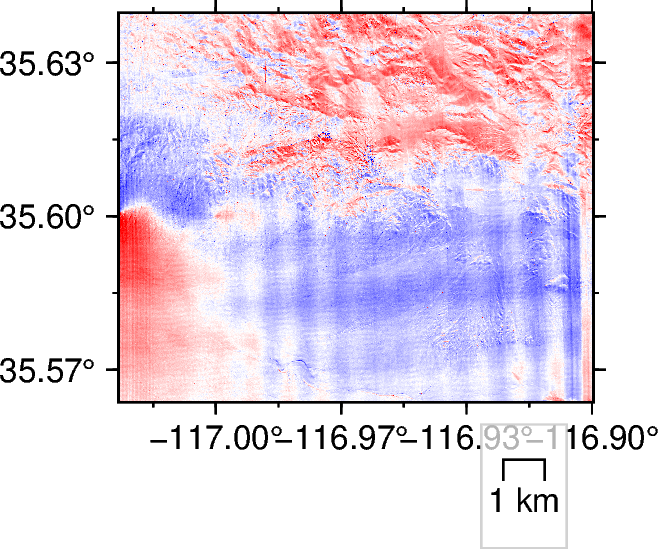

In [5]:
# Load deformation grids
im1_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/defaultsMECdem/EWmicmacEPSG4326_bidenoise_filtered.tif'
im2_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/defaultsMECdem/NSmicmacEPSG4326_bidenoise_filtered.tif'
im3_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/defaultsMECdem/UDfromHDispStackedEPSG4326_bidenoise_filtered_refiltered.tif'

im4_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMECdem/EWmicmacEPSG4326_bidenoise_filtered.tif'
im5_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMECdem/NSmicmacEPSG4326_bidenoise_filtered.tif'
im6_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMECdem/UDfromHDispStackedEPSG4326_bidenoise_filtered_refiltered.tif'
# Subfigures with the predeformed orthomosaics
# Introductory figure base
name = ['ExDEMDenoiseFilt','EyDEMDenoiseFilt','EzDEMDenoiseFilt','WxDEMDenoiseFilt','WyDEMDenoiseFilt','WzDEMDenoiseFilt']
imlist = [im1_lonlat,im2_lonlat,im3_lonlat,im4_lonlat,im5_lonlat,im6_lonlat]
for iml,n in zip(imlist[2:3],name[2:3]):
    im = rioxarray.open_rasterio(iml)
    #im -= im.mean()
    fig = pygmt.Figure()

    # Configuration for the 'current figure'.
    pygmt.config(MAP_FRAME_TYPE="plain")
    pygmt.config(FORMAT_GEO_MAP="ddd.xx")
    pygmt.config(FONT_ANNOT_PRIMARY="8p")
    pygmt.config(FONT_ANNOT_SECONDARY="6p")

    # Plot the base map of the main figure. 
    if n.startswith('E'):
        fig.basemap(region=e_inset_region, projection="M4c", frame=["WSen", "af"])
    else:
        fig.basemap(region=w_inset_region, projection="M4c", frame=["WSen", "af"])

    pygmt.makecpt(cmap='polar',series=[-1,1],background='o',reverse=True)
    fig.grdimage(grid=im,cmap=True)

    fig.basemap(map_scale='JBR+w1k+o-0.75c/0.5c+lkm',box="+c0.1/0.3+gwhite@30+p0.5p,grey@30,solid")#,rose='jBR+l,,,N+o0.5/0.3+w0.75c')
    fig.savefig(f'/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Manuscripts/Garlock/Figures/{n}Map.pdf',dpi=300)
    fig.show()

/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float64 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


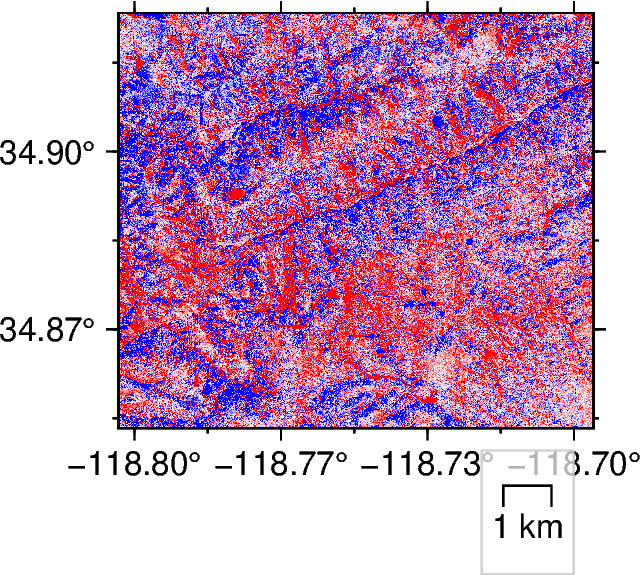

In [4]:
# Load deformation grids
im1_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/defaultsMECdem/EWmicmacEPSG4326.tif'
im2_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/defaultsMECdem/NSmicmacEPSG4326.tif'
im3_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/defaultsMECdem/UDmicmacEPSG4326.tif'

im4_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMECdem/EWmicmacEPSG4326.tif'
im5_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMECdem/NSmicmacEPSG4326.tif'
im6_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMECdem/UDmicmacEPSG4326.tif'
# Subfigures with the predeformed orthomosaics
# Introductory figure base
name = ['ExDEMNoFilt','EyNoDEMFilt','EzNoDEMFilt','WxNoDEMFilt','WyNoDEMFilt','WzNoDEMFilt']
imlist = [im1_lonlat,im2_lonlat,im3_lonlat,im4_lonlat,im5_lonlat,im6_lonlat]
for iml,n in zip(imlist[-1:],name[-1:]):
    im = rioxarray.open_rasterio(iml)
    fig = pygmt.Figure()

    # Configuration for the 'current figure'.
    pygmt.config(MAP_FRAME_TYPE="plain")
    pygmt.config(FORMAT_GEO_MAP="ddd.xx")
    pygmt.config(FONT_ANNOT_PRIMARY="8p")
    pygmt.config(FONT_ANNOT_SECONDARY="6p")

    # Plot the base map of the main figure. 
    if n.startswith('E'):
        fig.basemap(region=e_inset_region, projection="M4c", frame=["WSen", "af"])
    else:
        fig.basemap(region=w_inset_region, projection="M4c", frame=["WSen", "af"])

    pygmt.makecpt(cmap='polar',series=[-1,1],background='o',reverse=True)
    fig.grdimage(grid=im,cmap=True)

    fig.basemap(map_scale='JBR+w1k+o-0.75c/0.5c+lkm',box="+c0.1/0.3+gwhite@30+p0.5p,grey@30,solid")#,rose='jBR+l,,,N+o0.5/0.3+w0.75c')
    fig.savefig(f'/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Manuscripts/Garlock/Figures/{n}Map.pdf',dpi=300)
    fig.show()

/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float64 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


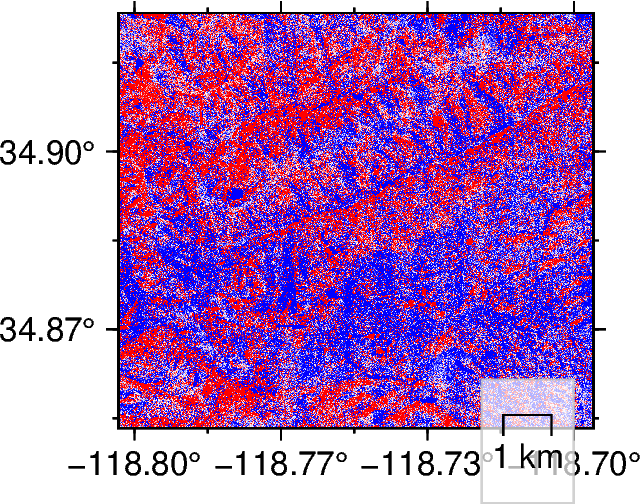

In [ ]:
# DEMs residuals
im1_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/defaultsMECdem/EWmicmacEPSG4326.tif'
im2_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/defaultsMECdem/NSmicmacEPSG4326.tif'
im3_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/defaultsMECdem/UDmicmacEPSG4326.tif'

im4_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMECdem/EWmicmacEPSG4326.tif'
im5_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMECdem/NSmicmacEPSG4326.tif'
im6_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMECdem/UDmicmacEPSG4326.tif'

im1m_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/EastdX-rioEPSG4326.tif'
im2m_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/EastdY-rioEPSG4326.tif'
im3m_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/EastdZ-rio-x4EPSG4326.tif'

im4m_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/WestdX-rioEPSG4326.tif'
im5m_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/WestdY-rioEPSG4326.tif'
im6m_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/WestdZ-rio-x4EPSG4326.tif'

# Introductory figure base
name = ['ExDEMnoFiltRes','EyDEMnoFiltRes','EzDEMnoFiltRes','WxDEMnoFiltRes','WyDEMnoFiltRes','WzDEMnoFiltRes']
imlist = [im1_lonlat,im2_lonlat,im3_lonlat,im4_lonlat,im5_lonlat,im6_lonlat]
immlist = [im1m_lonlat,im2m_lonlat,im3m_lonlat,im4m_lonlat,im5m_lonlat,im6m_lonlat]
for iml,imm,n in zip(imlist[5:],immlist[5:],name[5:]):
    immo = rioxarray.open_rasterio(imm)
    imob = rioxarray.open_rasterio(iml)
    im = immo - imob # model minus observed
    im -= im.mean()

    fig = pygmt.Figure()

    # Configuration for the 'current figure'.
    pygmt.config(MAP_FRAME_TYPE="plain")
    pygmt.config(FORMAT_GEO_MAP="ddd.xx")
    pygmt.config(FONT_ANNOT_PRIMARY="8p")
    pygmt.config(FONT_ANNOT_SECONDARY="6p")

    # Plot the base map of the main figure. 
    if n.startswith('E'):
        fig.basemap(region=e_inset_region, projection="M4c", frame=["WSen", "af"])
    else:
        fig.basemap(region=w_inset_region, projection="M4c", frame=["WSen", "af"])

    pygmt.makecpt(cmap='polar',series=[-0.5,0.5],background='o',reverse=True)
    fig.grdimage(grid=im,cmap=True)

    fig.basemap(map_scale='JBR+w1k+o-0.75c/-0.1c+lkm',box="+c0.1/0.3+gwhite@30+p0.5p,grey@30,solid")#,rose='jBR+l,,,N+o0.5/0.3+w0.75c')
    #fig.savefig(f'/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Manuscripts/Garlock/Figures/{n}Map.pdf',dpi=300)
    fig.show()

## Garlock West Clipped Region

/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float64 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


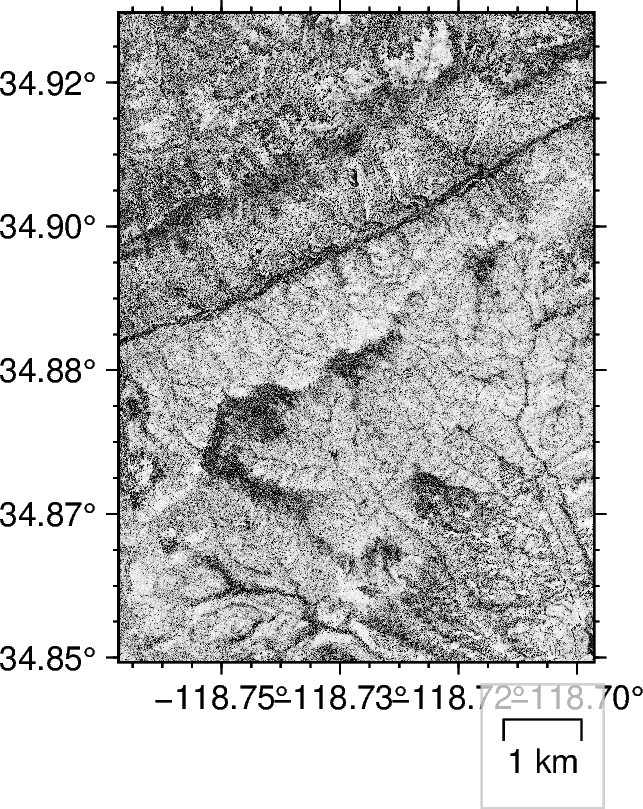

In [5]:
# Maps of clip region - Correl files from dem

# Load deformation grids
im1_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMECdem2022JanFebInc8/Correl-clipped-EPSG4326.tif'
# Subfigures with the predeformed orthomosaics
# Introductory figure base
name = ['WcorrelDEMJanFeb']
imlist = [im1_lonlat]
for iml,n in zip(imlist,name):
    im = rioxarray.open_rasterio(iml)
    fig = pygmt.Figure()

    # Configuration for the 'current figure'.
    pygmt.config(MAP_FRAME_TYPE="plain")
    pygmt.config(FORMAT_GEO_MAP="ddd.xx")
    pygmt.config(FONT_ANNOT_PRIMARY="8p")
    pygmt.config(FONT_ANNOT_SECONDARY="6p")

    # Plot the base map of the main figure. 
    fig.basemap(region=small_region, projection="M4c", frame=["WSen", "af"])

    pygmt.makecpt(cmap='gray',series=[0.1,1],background='o')
    fig.grdimage(grid=im,cmap=True)

    fig.basemap(map_scale='JBR+w1k+o-0.75c/0.5c+lkm',box="+c0.1/0.3+gwhite@30+p0.5p,grey@30,solid")#,rose='jBR+l,,,N+o0.5/0.3+w0.75c')
    fig.savefig(f'/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Manuscripts/Garlock/Figures/{n}Map.pdf',dpi=300)
    fig.show()

/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float64 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


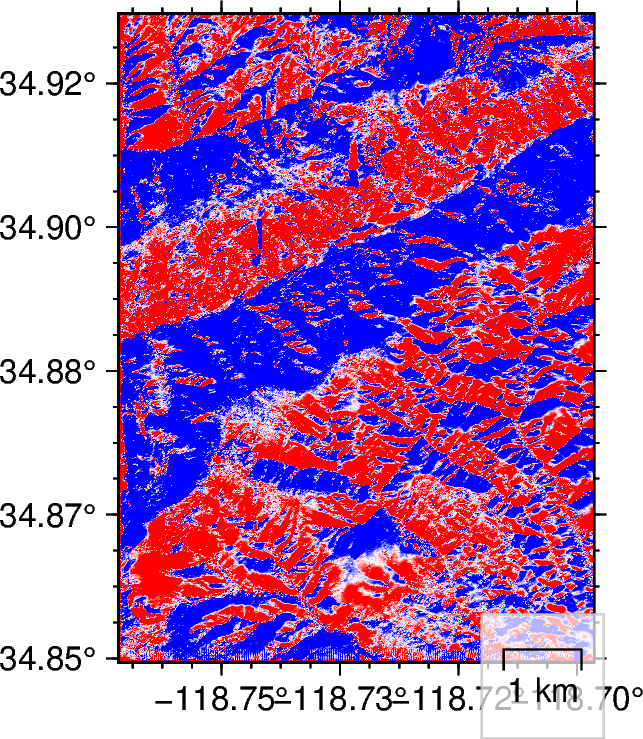

In [26]:
# DEMs residuals
im1_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMECdem2022JanFebInc8/EW-clipped-EPSG4326_bidenoise_filtered.tif'
im2_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMECdem2022JanFebInc8/NS-clipped-EPSG4326_bidenoise_filtered.tif'
im3_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMECdem2022JanFebInc8/UDfromHDispStackedEPSG4326_bidenoise_filtered_refiltered.tif'

# Introductory figure base
name = ['WxDEMJanFebFilt','WyDEMJanFebFilt','WzDEMJanFebFilt']
imlist = [im1_lonlat,im2_lonlat,im3_lonlat]
for iml,n in zip(imlist[-1:],name[-1:]):
    imob = rioxarray.open_rasterio(iml)
    imob.data = imob.data - np.mean(imob.data) # model minus observed

    fig = pygmt.Figure()

    # Configuration for the 'current figure'.
    pygmt.config(MAP_FRAME_TYPE="plain")
    pygmt.config(FORMAT_GEO_MAP="ddd.xx")
    pygmt.config(FONT_ANNOT_PRIMARY="8p")
    pygmt.config(FONT_ANNOT_SECONDARY="6p")

    # Plot the base map of the main figure. 
    fig.basemap(region=small_region, projection="M4c", frame=["WSen", "af"])

    pygmt.makecpt(cmap='polar',series=[-1,1],background='o',reverse=True)
    fig.grdimage(grid=imob,cmap=True)

    fig.basemap(map_scale='JBR+w1k+o-0.75c/-0.1c+lkm',box="+c0.1/0.3+gwhite@30+p0.5p,grey@30,solid")#,rose='jBR+l,,,N+o0.5/0.3+w0.75c')
    fig.savefig(f'/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Manuscripts/Garlock/Figures/{n}Map.pdf',dpi=300)
    fig.show()

/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float64 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


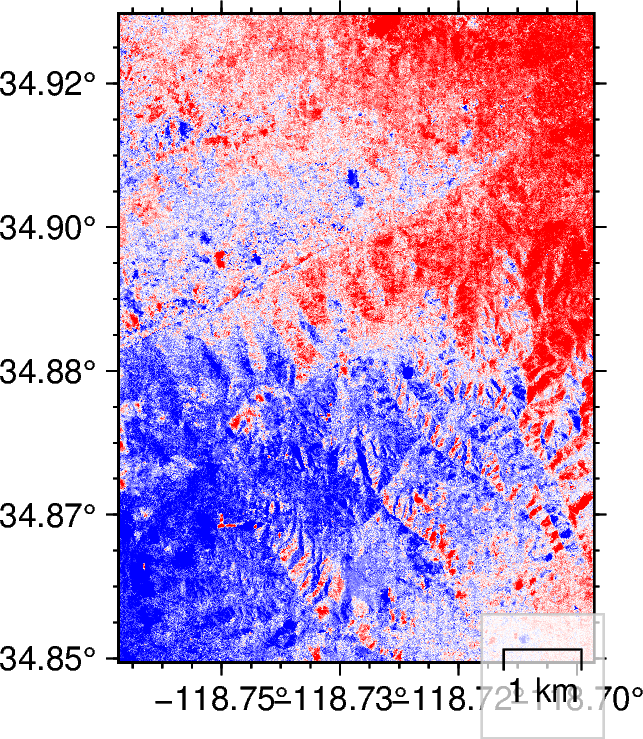

In [ ]:
# DEMs residuals
im1_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMECdem2022JanFebInc8/EW-clipped-EPSG4326_bidenoise_filtered.tif'
im2_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMECdem2022JanFebInc8/NS-clipped-EPSG4326_bidenoise_filtered.tif'

im1m_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/WestdX-rioEPSG4326-clipped.tif'
im2m_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/WestdY-rioEPSG4326-clipped.tif'

# Introductory figure base
name = ['WxDEMJanFebnoFiltRes','WyDEMJanFebnoFiltRes','WxOrthoJanFebnoFiltRes','WyOrthoJanFebnoFiltRes']
imlist = [im1_lonlat,im2_lonlat,im3_lonlat,im4_lonlat]
immlist = [im1m_lonlat,im2m_lonlat,im1m_lonlat,im2m_lonlat]
for iml,imm,n in zip(imlist[3:],immlist[3:],name[3:]):
    immo = rioxarray.open_rasterio(imm)
    imob = rioxarray.open_rasterio(iml)
    imob.data = (immo.data - imob.data) - np.mean(immo.data - imob.data) # model minus observed

    fig = pygmt.Figure()

    # Configuration for the 'current figure'.
    pygmt.config(MAP_FRAME_TYPE="plain")
    pygmt.config(FORMAT_GEO_MAP="ddd.xx")
    pygmt.config(FONT_ANNOT_PRIMARY="8p")
    pygmt.config(FONT_ANNOT_SECONDARY="6p")

    # Plot the base map of the main figure. 
    fig.basemap(region=small_region, projection="M4c", frame=["WSen", "af"])

    pygmt.makecpt(cmap='polar',series=[-0.5,0.5],background='o',reverse=True)
    fig.grdimage(grid=imob,cmap=True)

    fig.basemap(map_scale='JBR+w1k+o-0.75c/-0.1c+lkm',box="+c0.1/0.3+gwhite@30+p0.5p,grey@30,solid")#,rose='jBR+l,,,N+o0.5/0.3+w0.75c')
    fig.savefig(f'/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Manuscripts/Garlock/Figures/{n}Map.pdf',dpi=300)
    fig.show()

/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float64 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


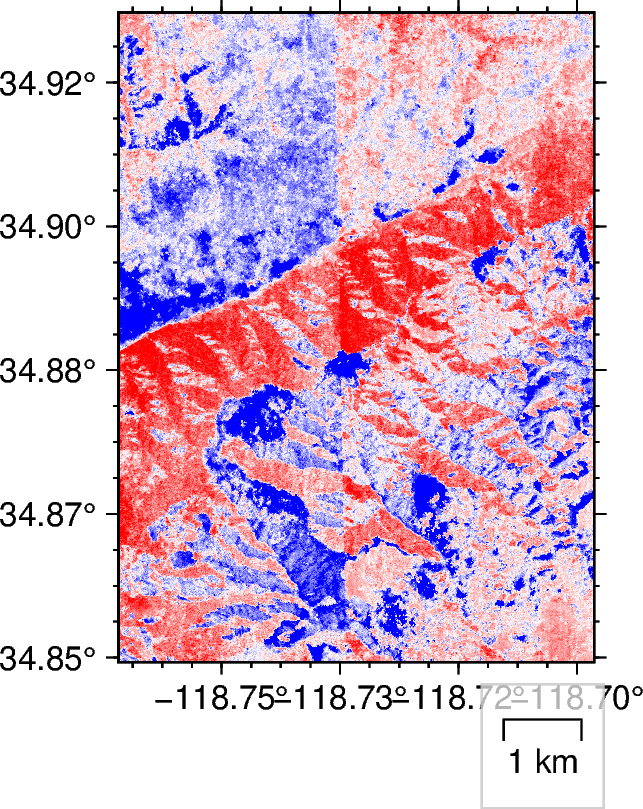

/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float64 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


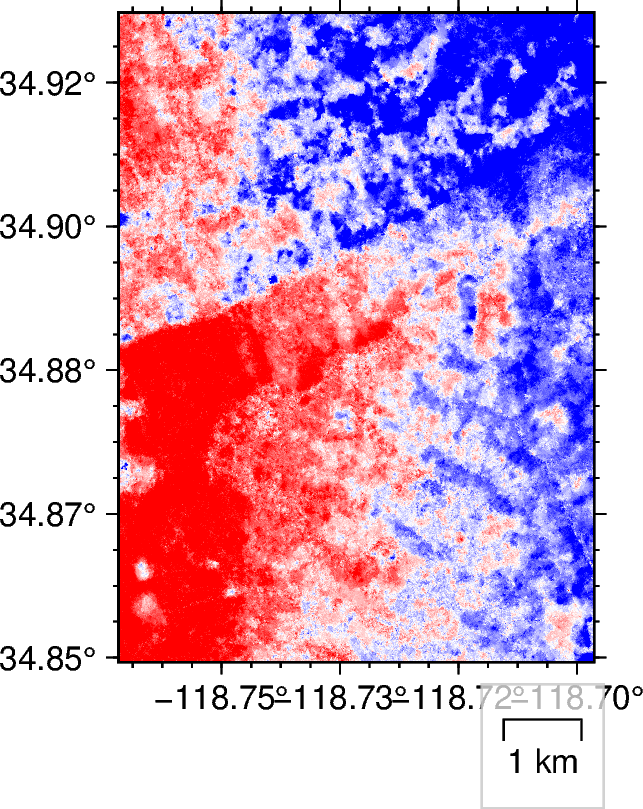

/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float64 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


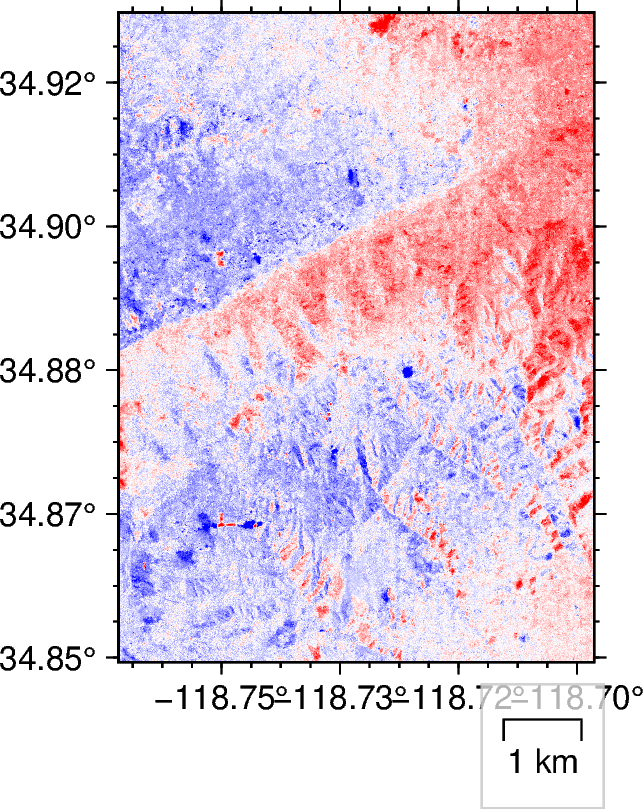

/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float64 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


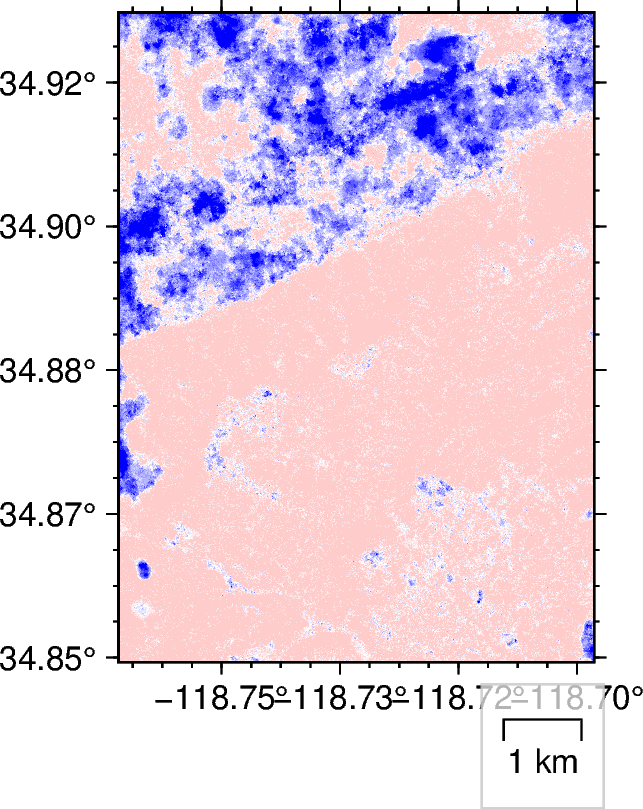

In [3]:
# Load deformation grids
im1_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC2022JanFeb/EW-clipped-EPSG4326.tif'
im2_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMECdem2022JanFeb/EW-clipped-EPSG4326.tif'
im3_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC2022JanFeb/NS-clipped-EPSG4326.tif'
im4_lonlat = '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMECdem2022JanFeb/NS-clipped-EPSG4326.tif'
# Subfigures with the predeformed orthomosaics
# Introductory figure base
name = ['WdXOrthoJanFeb','WdXDEMJanFeb','WdYOrthoJanFeb','WdYDEMJanFeb']
imlist = [im1_lonlat,im2_lonlat,im3_lonlat,im4_lonlat]
for iml,n in zip(imlist,name):
    im = rioxarray.open_rasterio(iml)
    im -= im.mean()
    fig = pygmt.Figure()

    # Configuration for the 'current figure'.
    pygmt.config(MAP_FRAME_TYPE="plain")
    pygmt.config(FORMAT_GEO_MAP="ddd.xx")
    pygmt.config(FONT_ANNOT_PRIMARY="8p")
    pygmt.config(FONT_ANNOT_SECONDARY="6p")

    # Plot the base map of the main figure. 
    fig.basemap(region=small_region, projection="M4c", frame=["WSen", "af"])

    pygmt.makecpt(cmap='polar',series=[-1,1],background='o',reverse=True)
    fig.grdimage(grid=im,cmap=True)

    fig.basemap(map_scale='JBR+w1k+o-0.75c/0.5c+lkm',box="+c0.1/0.3+gwhite@30+p0.5p,grey@30,solid")#,rose='jBR+l,,,N+o0.5/0.3+w0.75c')
    fig.savefig(f'/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Manuscripts/Garlock/Figures/{n}Map.pdf',dpi=300)
    fig.show()

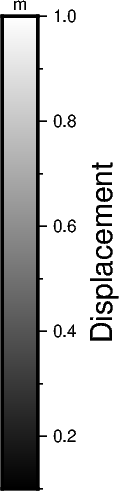

In [12]:
fig = pygmt.Figure()
# Configuration for the 'current figure'.
pygmt.config(MAP_FRAME_TYPE="plain")
pygmt.config(FORMAT_GEO_MAP="ddd.xx")
pygmt.config(FONT_ANNOT_PRIMARY="8p")
pygmt.config(FONT_ANNOT_SECONDARY="8p")
pygmt.makecpt(cmap='gray',series=[0.1,1.0],background='o')
fig.colorbar(region=[0,0.5,0,0.5],projection="M4c",position='jC+w4c/0.3c+v',frame=["x+lCorrelation", "y+lm"])
#fig.savefig(f'/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Manuscripts/Garlock/Figures/ColorbarGray.pdf',dpi=300)
fig.show()

## Stacked vs Single result 

In [20]:
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -118.80343 34.84839 -118.6959 34.92569 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC1/EWmicmac.tif     /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC1/EWmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -118.80343 34.84839 -118.6959 34.92569 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC1/NSmicmac.tif     /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC1/NSmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -118.80343 34.84839 -118.6959 34.92569 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC1/UDmicmac.tif     /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC1/UDmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -118.80343 34.84839 -118.6959 34.92569 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC1/Correlmicmac.tif /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC1/CorrelmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -118.80343 34.84839 -118.6959 34.92569 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC2/EWmicmac.tif     /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC2/EWmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -118.80343 34.84839 -118.6959 34.92569 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC2/NSmicmac.tif     /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC2/NSmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -118.80343 34.84839 -118.6959 34.92569 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC2/UDmicmac.tif     /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC2/UDmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -118.80343 34.84839 -118.6959 34.92569 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC2/Correlmicmac.tif /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC2/CorrelmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -118.80343 34.84839 -118.6959 34.92569 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC3/EWmicmac.tif     /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC3/EWmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -118.80343 34.84839 -118.6959 34.92569 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC3/NSmicmac.tif     /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC3/NSmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -118.80343 34.84839 -118.6959 34.92569 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC3/UDmicmac.tif     /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC3/UDmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -118.80343 34.84839 -118.6959 34.92569 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC3/Correlmicmac.tif /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC3/CorrelmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -118.80343 34.84839 -118.6959 34.92569 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC4/EWmicmac.tif     /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC4/EWmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -118.80343 34.84839 -118.6959 34.92569 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC4/NSmicmac.tif     /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC4/NSmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -118.80343 34.84839 -118.6959 34.92569 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC4/UDmicmac.tif     /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC4/UDmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -118.80343 34.84839 -118.6959 34.92569 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC4/Correlmicmac.tif /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC4/CorrelmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -118.80343 34.84839 -118.6959 34.92569 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMECdem/EWmicmac.tif   /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMECdem/EWmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -118.80343 34.84839 -118.6959 34.92569 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMECdem/NSmicmac.tif   /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMECdem/NSmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -118.80343 34.84839 -118.6959 34.92569 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMECdem/UDmicmac.tif   /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMECdem/UDmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -118.80343 34.84839 -118.6959 34.92569 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMECdem/Correlmicmac.tif /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/West/micmac/defaultsMECdem/CorrelmicmacEPSG4326.tif

Creating output file that is 21560P x 15499L.
Using internal nodata values (e.g. 0) for image /Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC1/EWmicmac.tif.
Copying nodata values from source /Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC1/EWmicmac.tif to destination /Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC1/EWmicmacEPSG4326.tif.
Processing /Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC1/EWmicmac.tif [1/1] : 0...10...20...30...40...50...60...70...80...90...100 - done.
Creating output file that is 21560P x 15499L.
Using internal nodata values (e.g. 0) for image /Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC1/NSmicmac.tif.
Copying nodata values from source /Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC1/NSmicmac.tif to destination /Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMEC1/NSmicmacEPSG4326.tif

In [5]:
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -117.0256160 35.559928 -116.899990 35.6439349 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC1/EWmicmac.tif     /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC1/EWmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -117.0256160 35.559928 -116.899990 35.6439349 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC1/NSmicmac.tif     /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC1/NSmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -117.0256160 35.559928 -116.899990 35.6439349 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC1/UDmicmac.tif     /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC1/UDmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -117.0256160 35.559928 -116.899990 35.6439349 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC1/Correlmicmac.tif /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC1/CorrelmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -117.0256160 35.559928 -116.899990 35.6439349 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC2/EWmicmac.tif     /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC2/EWmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -117.0256160 35.559928 -116.899990 35.6439349 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC2/NSmicmac.tif     /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC2/NSmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -117.0256160 35.559928 -116.899990 35.6439349 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC2/UDmicmac.tif     /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC2/UDmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -117.0256160 35.559928 -116.899990 35.6439349 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC2/Correlmicmac.tif /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC2/CorrelmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -117.0256160 35.559928 -116.899990 35.6439349 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC3/EWmicmac.tif     /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC3/EWmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -117.0256160 35.559928 -116.899990 35.6439349 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC3/NSmicmac.tif     /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC3/NSmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -117.0256160 35.559928 -116.899990 35.6439349 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC3/UDmicmac.tif     /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC3/UDmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -117.0256160 35.559928 -116.899990 35.6439349 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC3/Correlmicmac.tif /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC3/CorrelmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -117.0256160 35.559928 -116.899990 35.6439349 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC4/EWmicmac.tif     /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC4/EWmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -117.0256160 35.559928 -116.899990 35.6439349 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC4/NSmicmac.tif     /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC4/NSmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -117.0256160 35.559928 -116.899990 35.6439349 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC4/UDmicmac.tif     /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC4/UDmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -117.0256160 35.559928 -116.899990 35.6439349 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC4/Correlmicmac.tif /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC4/CorrelmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -117.0256160 35.559928 -116.899990 35.6439349 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMECdem/EWmicmac.tif   /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMECdem/EWmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -117.0256160 35.559928 -116.899990 35.6439349 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMECdem/NSmicmac.tif   /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMECdem/NSmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -117.0256160 35.559928 -116.899990 35.6439349 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMECdem/UDmicmac.tif   /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMECdem/UDmicmacEPSG4326.tif
#!gdalwarp -t_srs EPSG:4326 -overwrite -te -117.0256160 35.559928 -116.899990 35.6439349 -r near -of GTiff /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMECdem/Correlmicmac.tif /Volumes/Extreme\ Pro/Projects/Garlock/Deformation/East/micmac/defaultsMECdem/CorrelmicmacEPSG4326.tif

Creating output file that is 25061P x 16759L.
Using internal nodata values (e.g. 0) for image /Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC1/EWmicmac.tif.
Copying nodata values from source /Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC1/EWmicmac.tif to destination /Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC1/EWmicmacEPSG4326.tif.
Processing /Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC1/EWmicmac.tif [1/1] : 0...10...20...30...40...50...60...70...80...90...100 - done.
Creating output file that is 25061P x 16759L.
Using internal nodata values (e.g. 0) for image /Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC1/NSmicmac.tif.
Copying nodata values from source /Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC1/NSmicmac.tif to destination /Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/defaultsMEC1/NSmicmacEPSG4326.tif

In [23]:
foldlist = ['defaultsMEC1','defaultsMEC2','defaultsMEC3','defaultsMEC4','defaultsMECdem']
Region = 'West'
for fold in foldlist:
    for direction, cart in zip(['EW','NS','UD'],['X','Y','Z']):
        imun = rioxarray.open_rasterio(f'/Volumes/Extreme Pro/Projects/Garlock/Deformation/{Region}/micmac/{fold}/{direction}micmacEPSG4326.tif')
        imst = rioxarray.open_rasterio(f'/Volumes/Extreme Pro/Projects/Garlock/Deformation/{Region}/micmac/{direction}DispStackedEPSG4326.tif')
        #imco = rioxarray.open_rasterio('/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Projects/Garlock/Deformation/East/micmac/defaultsMEC3/CorrelmicmacEPSG4326.tif')

        immo = rioxarray.open_rasterio(f'/Volumes/Extreme Pro/Projects/Garlock/Deformation/{Region}/{Region}d{cart}-rioEPSG4326.tif')

        # Residual maps of model vs unstacked and stacked results
        im1 = immo - imun
        
        im1 -= im1.mean()
        im2 = immo - imst
        im2 -= im2.mean()

        print('Mean rmse, unstacked vs stacked',fold, direction)
        print(np.round(np.mean(np.abs(im1)).values*100,1),np.round(np.mean(np.abs(im2)).values*100,1))


Mean rmse, unstacked vs stacked defaultsMEC1 EW
121.9 102.5
Mean rmse, unstacked vs stacked defaultsMEC1 NS
90.1 82.3
Mean rmse, unstacked vs stacked defaultsMEC1 UD
161.1 155.3
Mean rmse, unstacked vs stacked defaultsMEC2 EW
79.4 102.5
Mean rmse, unstacked vs stacked defaultsMEC2 NS
59.1 82.3
Mean rmse, unstacked vs stacked defaultsMEC2 UD
155.0 155.3
Mean rmse, unstacked vs stacked defaultsMEC3 EW
133.0 102.5
Mean rmse, unstacked vs stacked defaultsMEC3 NS
119.3 82.3
Mean rmse, unstacked vs stacked defaultsMEC3 UD
160.1 155.3
Mean rmse, unstacked vs stacked defaultsMEC4 EW
109.5 102.5
Mean rmse, unstacked vs stacked defaultsMEC4 NS
100.2 82.3
Mean rmse, unstacked vs stacked defaultsMEC4 UD
157.9 155.3
Mean rmse, unstacked vs stacked defaultsMECdem EW
52.9 102.5
Mean rmse, unstacked vs stacked defaultsMECdem NS
44.4 82.3
Mean rmse, unstacked vs stacked defaultsMECdem UD
149.8 155.3


In [1]:
from scipy import stats
import rasterio
from rasterio.mask import mask
import os


In [2]:
from shapely.geometry import box

In [ ]:
# Median Absolute Error
immod = ['/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/EastdX-rioEPSG4326.tif',
         '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/EastdX-rioEPSG4326.tif',
         '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/EastdY-rioEPSG4326.tif',
         '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/EastdY-rioEPSG4326.tif',
         '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/EastdZ-rio-x4EPSG4326.tif',
        '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/EastdZ-rio-x4EPSG4326.tif']
imlist = ['/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/EWDispStackedEPSG4326_bidenoise_filtered.tif',
        '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/defaultsMECdem/EWmicmacEPSG4326_bidenoise_filtered.tif',
        '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/NSDispStackedEPSG4326_bidenoise_filtered.tif',
        '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/defaultsMECdem/NSmicmacEPSG4326_bidenoise_filtered.tif',
        '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/UDfromHDispStackedEPSG4326_bidenoise_filtered_refiltered.tif',
        '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/defaultsMECdem/UDfromHdispStackedEPSG4326_bidenoise_filtered_refiltered.tif']

# Mean Absolute Error
immod = ['/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/WestdX-rioEPSG4326.tif',
         '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/WestdX-rioEPSG4326.tif',
         '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/WestdY-rioEPSG4326.tif',
         '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/WestdY-rioEPSG4326.tif',
         '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/WestdZ-rio-x4EPSG4326.tif',
        '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/WestdZ-rio-x4EPSG4326.tif']
imlist = ['/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/EWDispStackedEPSG4326_bidenoise_filtered.tif',
        '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMECdem/EWmicmacEPSG4326_bidenoise_filtered.tif',
        '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/NSDispStackedEPSG4326_bidenoise_filtered.tif',
        '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMECdem/NSmicmacEPSG4326_bidenoise_filtered.tif',
        '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/UDfromHDispStackedEPSG4326_bidenoise_filtered_refiltered.tif',
        '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMECdem/UDfromHdispStackedEPSG4326_bidenoise_filtered_refiltered.tif']

# Mean Absolute Error
immod = ['/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/WestdX-rioEPSG4326.tif',
         '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/WestdY-rioEPSG4326.tif',
         '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/WestdZ-rioEPSG4326.tif']

imlist = ['/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMECdem2022JanFebInc8/EW-clipped-EPSG4326_bidenoise_filtered.tif',
        '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMECdem2022JanFebInc8/NS-clipped-EPSG4326_bidenoise_filtered.tif',
         '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMECdem2022JanFebInc8/UDfromHdispStackedEPSG4326_bidenoise_filtered_refiltered.tif']

import rasterio
from rasterio.mask import mask
from rasterio.warp import reproject, Resampling
from shapely.geometry import box
from scipy import stats
import numpy as np
import os

# Helper function to reproject and align rasters
def reproject_raster(source, target, bounds):
    with rasterio.open(source) as src:
        profile = src.profile
        # Update profile for the cropped bounds and resolution of the target raster
        profile.update({
            "width": target.width,
            "height": target.height,
            "transform": target.transform,
        })
        # Create an in-memory array for the reprojected data
        reprojected = np.empty(shape=(1, target.height, target.width), dtype=profile['dtype'])
        reproject(
            source=src.read(1),  # Read the first band
            destination=reprojected[0],
            src_transform=src.transform,
            src_crs=src.crs,
            dst_transform=target.transform,
            dst_crs=target.crs,
            resampling=Resampling.bilinear,
        )
        return reprojected

# Processing loop
for im, imm in zip(imlist, immod):
    with rasterio.open(im) as ob, rasterio.open(imm) as mod:
        # Find the intersection of extents using Shapely
        bbox1 = box(*ob.bounds)
        bbox2 = box(*mod.bounds)
        intersection = bbox1.intersection(bbox2)

        if not intersection.is_empty:
            # Convert intersection to GeoJSON format
            intersection_geojson = [intersection.__geo_interface__]

            # Clip both rasters to the common bounds
            obc, ob_transform = rasterio.mask.mask(ob, intersection_geojson, crop=True)
            modc, mod_transform = rasterio.mask.mask(mod, intersection_geojson, crop=True)

            # Reproject modc to align with obc
            modc_aligned = reproject_raster(imm, ob, intersection_geojson)

            # Compute median-subtracted data in-memory
            ob_data = obc[0] - np.median(obc[0])  # First band assumed
            mod_data = modc_aligned[0] - np.median(modc_aligned[0])  # First band assumed

            # Median Absolute Deviation
            res = np.abs(ob_data - mod_data)
            median_res = np.median(res)
            mad_res = stats.median_abs_deviation(res.flatten())

            # Print results
            print(os.path.basename(im), os.path.basename(imm))
            print(np.round(median_res, 2), f'({np.round(mad_res, 2)})')
        else:
            print(f"No overlapping area between {os.path.basename(im)} and {os.path.basename(imm)}")

EW-clipped-EPSG4326_bidenoise_filtered.tif WestdX-rioEPSG4326.tif
0.57 (0.32)
NS-clipped-EPSG4326_bidenoise_filtered.tif WestdY-rioEPSG4326.tif
0.29 (0.17)
UDfromHdispStackedEPSG4326_bidenoise_filtered_refiltered.tif WestdZ-rioEPSG4326.tif
1.47 (0.88)


In [27]:
intersection_geojson

[{'type': 'Polygon',
  'coordinates': (((-118.76429, 34.84964917478547),
    (-118.76429, 34.92464),
    (-118.69781192161409, 34.92464),
    (-118.69781192161409, 34.84964917478547),
    (-118.76429, 34.84964917478547)),)}]

In [35]:
# Account for small region
# Mean Absolute Error
immod = ['/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/EastdX-rioEPSG4326.tif',
         '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/EastdX-rioEPSG4326.tif',
         '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/EastdY-rioEPSG4326.tif',
         '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/EastdY-rioEPSG4326.tif',
         '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/EastdZ-rio-x4EPSG4326.tif',
        '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/EastdZ-rio-x4EPSG4326.tif']
imlist = ['/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/EWDispStackedEPSG4326_bidenoise_filtered.tif',
        '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/defaultsMECdem/EWmicmacEPSG4326_bidenoise_filtered.tif',
        '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/NSDispStackedEPSG4326_bidenoise_filtered.tif',
        '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/defaultsMECdem/NSmicmacEPSG4326_bidenoise_filtered.tif',
        '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/UDfromHDispStackedEPSG4326_bidenoise_filtered_refiltered.tif',
        '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/defaultsMECdem/UDfromHdispStackedEPSG4326_bidenoise_filtered_refiltered.tif']

# Mean Absolute Error
immod = ['/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/WestdX-rioEPSG4326.tif',
         #'/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/WestdX-rioEPSG4326.tif',
         '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/WestdY-rioEPSG4326.tif',
         #'/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/WestdY-rioEPSG4326.tif',
        # '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/WestdZ-rio-x4EPSG4326.tif',
        '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/WestdZ-rio-x4EPSG4326.tif']
imlist = [#'/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/EWDispStackedEPSG4326_bidenoise_filtered.tif',
        '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMECdem/EWmicmacEPSG4326_bidenoise_filtered.tif',
        #'/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/NSDispStackedEPSG4326_bidenoise_filtered.tif',
        '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMECdem/NSmicmacEPSG4326_bidenoise_filtered.tif',
        #'/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/UDfromHDispStackedEPSG4326_bidenoise_filtered_refiltered.tif',
        '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMECdem/UDfromHdispStackedEPSG4326_bidenoise_filtered_refiltered.tif']

# Mean Absolute Error
#immod = ['/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/WestdX-rioEPSG4326.tif',
#         '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/WestdY-rioEPSG4326.tif',
#         '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/WestdZ-rioEPSG4326.tif']
#
#imlist = ['/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMECdem2022JanFebInc8/EW-clipped-EPSG4326_bidenoise_filtered.tif',
#        '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMECdem2022JanFebInc8/NS-clipped-EPSG4326_bidenoise_filtered.tif',
#         '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMECdem2022JanFebInc8/UDfromHdispStackedEPSG4326_bidenoise_filtered_refiltered.tif']

import rasterio
from rasterio.mask import mask
from rasterio.warp import reproject, Resampling
from shapely.geometry import box
from scipy import stats
import numpy as np
import os

# Helper function to reproject and align rasters
def reproject_raster(source, target, bounds):
    with rasterio.open(source) as src:
        profile = src.profile
        # Update profile for the cropped bounds and resolution of the target raster
        profile.update({
            "width": target.width,
            "height": target.height,
            "transform": target.transform,
        })
        # Create an in-memory array for the reprojected data
        reprojected = np.empty(shape=(1, target.height, target.width), dtype=profile['dtype'])
        reproject(
            source=src.read(1),  # Read the first band
            destination=reprojected[0],
            src_transform=src.transform,
            src_crs=src.crs,
            dst_transform=target.transform,
            dst_crs=target.crs,
            resampling=Resampling.bilinear,
        )
        return reprojected

# Processing loop
for im, imm in zip(imlist, immod):
    with rasterio.open(im) as ob, rasterio.open(imm) as mod:
    
        # Clip both rasters to the common bounds
        obc, ob_transform = rasterio.mask.mask(ob, intersection_geojson, crop=True)
        modc, mod_transform = rasterio.mask.mask(mod, intersection_geojson, crop=True)

        # Reproject modc to align with obc
        #modc_aligned = reproject_raster(imm, obc, intersection_geojson)

        # Compute median-subtracted data in-memory
        ob_data = obc[0] - np.median(obc[0])  # First band assumed
        mod_data = modc[0] - np.median(modc[0])  # First band assumed

        # Median Absolute Deviation
        res = np.abs(ob_data - mod_data)
        median_res = np.median(res)
        mad_res = stats.median_abs_deviation(res.flatten())

        # Print results
        print(os.path.basename(im), os.path.basename(imm))
        print(np.round(median_res, 2), f'({np.round(mad_res, 2)})')


EWmicmacEPSG4326_bidenoise_filtered.tif WestdX-rioEPSG4326.tif
0.43 (0.24)
NSmicmacEPSG4326_bidenoise_filtered.tif WestdY-rioEPSG4326.tif
0.34 (0.2)
UDfromHdispStackedEPSG4326_bidenoise_filtered_refiltered.tif WestdZ-rio-x4EPSG4326.tif
0.51 (0.34)


In [17]:
# Mean Absolute Error
immod = ['/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/EastdX-rioEPSG4326.tif',
         '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/EastdX-rioEPSG4326.tif',
         '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/EastdY-rioEPSG4326.tif',
         '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/EastdY-rioEPSG4326.tif',
         '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/EastdZ-rio-x4EPSG4326.tif',
        '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/EastdZ-rio-x4EPSG4326.tif']
imlist = ['/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/EWDispStackedEPSG4326_bidenoise_filtered.tif',
        '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/defaultsMECdem/EWmicmacEPSG4326_bidenoise_filtered.tif',
        '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/NSDispStackedEPSG4326_bidenoise_filtered.tif',
        '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/defaultsMECdem/NSmicmacEPSG4326_bidenoise_filtered.tif',
        '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/UDfromHDispStackedEPSG4326_bidenoise_filtered_refiltered.tif',
        '/Volumes/Extreme Pro/Projects/Garlock/Deformation/East/micmac/defaultsMECdem/UDfromHdispStackedEPSG4326_bidenoise_filtered_refiltered.tif']

# Mean Absolute Error
immod = ['/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/WestdX-rioEPSG4326.tif',
         '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/WestdX-rioEPSG4326.tif',
         '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/WestdY-rioEPSG4326.tif',
         '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/WestdY-rioEPSG4326.tif',
         '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/WestdZ-rio-x4EPSG4326.tif',
        '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/WestdZ-rio-x4EPSG4326.tif']
imlist = ['/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/EWDispStackedEPSG4326_bidenoise_filtered.tif',
        '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMECdem/EWmicmacEPSG4326_bidenoise_filtered.tif',
        '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/NSDispStackedEPSG4326_bidenoise_filtered.tif',
        '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMECdem/NSmicmacEPSG4326_bidenoise_filtered.tif',
        '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/UDfromHDispStackedEPSG4326_bidenoise_filtered_refiltered.tif',
        '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMECdem/UDfromHdispStackedEPSG4326_bidenoise_filtered_refiltered.tif']

# Mean Absolute Error
immod = ['/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/WestdX-rioEPSG4326.tif',
         '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/WestdY-rioEPSG4326.tif']

imlist = ['/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMECdem2022JanFebInc8/EW-clipped-EPSG4326_bidenoise_filtered.tif',
        '/Volumes/Extreme Pro/Projects/Garlock/Deformation/West/micmac/defaultsMECdem2022JanFebInc8/NS-clipped-EPSG4326_bidenoise_filtered.tif']

import rasterio
from rasterio.mask import mask
from rasterio.warp import reproject, Resampling
from shapely.geometry import box
from scipy import stats
import numpy as np
import os

# Helper function to reproject and align rasters
def reproject_raster(source, target, bounds):
    with rasterio.open(source) as src:
        profile = src.profile
        # Update profile for the cropped bounds and resolution of the target raster
        profile.update({
            "width": target.width,
            "height": target.height,
            "transform": target.transform,
        })
        # Create an in-memory array for the reprojected data
        reprojected = np.empty(shape=(1, target.height, target.width), dtype=profile['dtype'])
        reproject(
            source=src.read(1),  # Read the first band
            destination=reprojected[0],
            src_transform=src.transform,
            src_crs=src.crs,
            dst_transform=target.transform,
            dst_crs=target.crs,
            resampling=Resampling.bilinear,
        )
        return reprojected

# Processing loop
for im, imm in zip(imlist, immod):
    with rasterio.open(im) as ob, rasterio.open(imm) as mod:
        # Find the intersection of extents using Shapely
        bbox1 = box(*ob.bounds)
        bbox2 = box(*mod.bounds)
        intersection = bbox1.intersection(bbox2)

        if not intersection.is_empty:
            # Convert intersection to GeoJSON format
            intersection_geojson = [intersection.__geo_interface__]

            # Clip both rasters to the common bounds
            obc, ob_transform = mask(ob, intersection_geojson, crop=True)
            modc, mod_transform = mask(mod, intersection_geojson, crop=True)

            # Reproject modc to align with obc
            modc_aligned = reproject_raster(imm, ob, intersection_geojson)

            # Compute median-subtracted data in-memory
            ob_data = (obc[0] - np.median(obc[0])).flatten()  # First band assumed
            mod_data = (modc_aligned[0] - np.median(modc_aligned[0])).flatten()  # First band assumed

            # Mean Absolute Error and Deviation
            mae = mean_absolute_error(mod_data,ob_data)
            mad = np.sum(np.absolute(ob_data - np.mean(ob_data)))/len(ob_data)

            # Print results
            print(os.path.basename(im), os.path.basename(imm))
            print(np.round(mae, 2), f'({np.round(mad, 2)})')
        else:
            print(f"No overlapping area between {os.path.basename(im)} and {os.path.basename(imm)}")

EW-clipped-EPSG4326_bidenoise_filtered.tif WestdX-rioEPSG4326.tif
0.68 (0.67)
NS-clipped-EPSG4326_bidenoise_filtered.tif WestdY-rioEPSG4326.tif
0.35 (0.34)


In [ ]:
np.sum(ob_data - np.mean(ob_data)

np.float64(-9.88620740827173e-10)

In [8]:
from sklearn.metrics import mean_absolute_error



## Profiles

/Users/chanagan/miniconda3/envs/pygmt/lib/python3.12/site-packages/pygmt/src/grdimage.py:168: RuntimeWarning: Input image has dtype: float64 which is unsupported, and may result in an incorrect output. Please recast image to a uint8 dtype and/or scale to 0-255 range, e.g. using a histogram equalization function like skimage.exposure.equalize_hist.
  lib.virtualfile_in(check_kind="raster", data=grid) as vingrd,


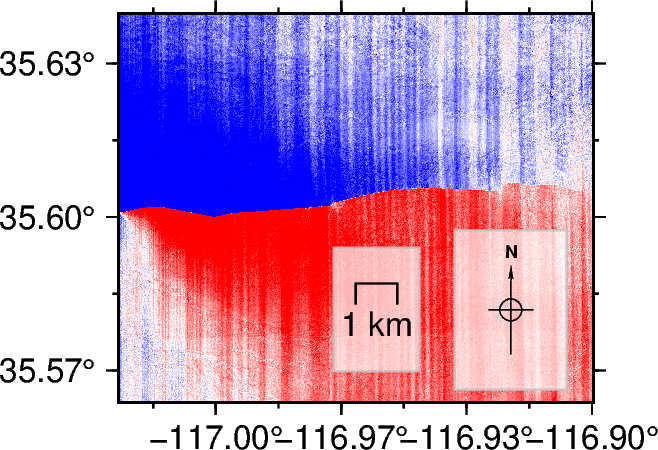

In [11]:
# Subfigures with the predeformed orthomosaics
# Introductory figure base
plt.close()
fig = pygmt.Figure()

# Configuration for the 'current figure'.
pygmt.config(MAP_FRAME_TYPE="plain")
pygmt.config(FORMAT_GEO_MAP="ddd.xx")
pygmt.config(FONT_ANNOT_PRIMARY="8p")
pygmt.config(FONT_ANNOT_SECONDARY="6p")

# Plot the base map of the main figure. 
fig.basemap(region=e_inset_region, projection="M4c", frame=["WSne", "af"])

# photo
if im is im1 or im is im2:
    pygmt.makecpt(cmap='polar',series=[-0.5,0.5],background='o',reverse=True)
else:
    pygmt.makecpt(cmap='gray',series=[0,1],background='o')
fig.grdimage(grid=im,cmap=True)



fig.basemap(map_scale='JBR+w1k+o-2c/-1c+lkm',box="+c0.1/0.3+gwhite@30+p0.5p,grey@30,solid",rose='jBR+l,,,N+o0.5/0.4+w0.75c')
if im is im1:
    fig.savefig('/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Manuscripts/Garlock/Figures/StackedVUnstacked-Unstacked.pdf',dpi=300)
if im is im2:
    fig.savefig('/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Manuscripts/Garlock/Figures/StackedVUnstacked-Stacked.pdf',dpi=300)
if im is imco:
    fig.savefig('/Users/chanagan/Library/CloudStorage/OneDrive-DOI/Manuscripts/Garlock/Figures/StackedVUnstacked-Correl.pdf',dpi=300)

fig.show()

In [20]:
imco.

<xarray.DataArray (band: 1, y: 16759, x: 25061)> Size: 3GB
[419997299 values with dtype=float64]
Coordinates:
  * band         (band) int64 8B 1
  * x            (x) float64 200kB -117.0 -117.0 -117.0 ... -116.9 -116.9 -116.9
  * y            (y) float64 134kB 35.64 35.64 35.64 35.64 ... 35.56 35.56 35.56
    spatial_ref  int64 8B 0
Attributes:
    AREA_OR_POINT:  Area
    _FillValue:     0.0
    scale_factor:   1.0
    add_offset:     0.0

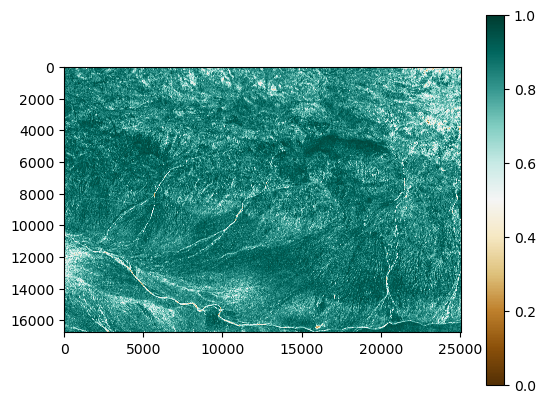

In [37]:
plt.imshow(im.data[0],vmin=0,vmax=1,cmap='BrBG')
plt.colorbar()